<h1>Évaluation de BiomedParse sur données DICOM pulmonaires</h1>

<h2>Objectif :</h2>
<p>
Ce notebook permet d’évaluer les performances du modèle <strong>BiomedParse</strong> appliqué à des images scanner (CT thoracique) au format DICOM. 
Il utilise des fichiers de segmentation <code>DICOM-SEG</code> comme vérité terrain pour mesurer la qualité des prédictions générées à partir de <strong>prompts textuels</strong> (ex: <code>"tumor"</code>).
</p>

<h2>Étapes principales :</h2>
<ol>
  <li><strong>Chargement et initialisation</strong> du modèle BiomedParse avec configuration et poids adaptés.</li>
  <li><strong>Inférence</strong> sur les images DICOM via prompts et génération de masques de prédiction.</li>
  <li><strong>Comparaison automatique</strong> des masques prédits avec les masques de segmentation GT (Dice Score par image et par patient).</li>
  <li><strong>Filtrage qualitatif</strong> des masques via auto-Dice (conservation des plus cohérents).</li>
  <li><strong>Extraction RECIST</strong> : mesure de la plus grande lésion (en mm) dans chaque volume, et classification "Mesurable / Non mesurable".</li>
  <li><strong>Analyse globale</strong> : statistiques, écarts de mesure, précision des prédictions RECIST, et visualisations finales.</li>
</ol>

<h2>Données attendues :</h2>
<p>Le notebook suppose que les données sont disponibles dans le répertoire <code>./test/dcm/</code> avec la structure suivante :</p>

<pre><code>./test/dcm/
  ├── &lt;patient_id&gt;/
      ├── 0/   ← fichiers DICOM image (1 par coupe)
      └── 1/
          └── 1-1.dcm  ← fichier DICOM SEG (segmentations vérité terrain)
</code></pre>

<p>
  Seules les coupes DICOM segmentées dans le fichier SEG sont attendues dans <code>0/</code>.<br>
  On peut utiliser pour ça <code>supprNonSeg.py</code>.
</p>

<h2>Prompt utilisé :</h2>
<p>Le prompt textuel pour guider l’inférence est défini dans :</p>
<pre><code>text_prompt = ["tumor"]</code></pre>

<h2>À savoir avant d’exécuter :</h2>
<ul>
  <li>Les chemins <code>configs/</code> et <code>pretrained/</code> doivent déjà être présents dans le dépôt cloné (ceci inclut le modèle modifié).</li>
  <li>Le notebook désactive volontairement la vérification SSL pour permettre les appels à HuggingFace dans un environnement interne.</li>
  <li>Le modèle peut être exécuté sur CPU ou GPU. L’usage de CUDA est automatique si disponible.</li>
  <li>La sélection des meilleurs masques s’appuie sur une double itération de tri par Dice auto-comparatif.</li>
</ul>

<h2>Résultats disponibles :</h2>
<ul>
  <li>Dice moyen par patient (masques bruts et filtrés)</li>
  <li>Pourcentage de patients avec lésion RECIST mesurable</li>
  <li>Écart de mesure (en mm) entre GT et prédiction</li>
  <li>Précision du modèle à prédire correctement le statut RECIST</li>
  <li>Visualisations : Boxplots, overlays masques vs GT</li>
</ul>

<p>Base de données utilisée : <a href="https://www.cancerimagingarchive.net/collection/nsclc-radiomics/">cancerimagingarchive.net/collection/nsclc-radiomics/</a></p>

<hr />
<p><em>Pour toute modification du modèle, du prompt ou du jeu de données, adapter les chemins et fonctions au besoin.</em></p>


In [1]:
from PIL import Image
import pydicom
import numpy as np
import cv2
import torch
import json
import argparse
import torch
import glob
from math import dist
from scipy.spatial.distance import pdist, squareform
import matplotlib.pyplot as plt
from modeling.BaseModel import BaseModel
from modeling import build_model
from utilities.distributed import init_distributed
from utilities.arguments import load_opt_from_config_files
from utilities.constants import BIOMED_CLASSES

from inference_utils.processing_utils import read_dicom
from inference_utils.processing_utils import read_png
from inference_utils.inference import interactive_infer_image
from inference_utils.inference import interactive_infer_image_all
from inference_utils.output_processing import check_mask_stats


import os
os.environ['HF_HUB_DISABLE_SSL_VERIFICATION'] = '1'

import urllib3
urllib3.disable_warnings()

import ssl
import requests

# Pour forcer le trust du certificat (déconseillé en prod)
ssl._create_default_https_context = ssl._create_unverified_context

# Vérifie manuellement si HuggingFace répond :
requests.get("https://huggingface.co", verify=False)


# Build model config
def parse_option():
    parser = argparse.ArgumentParser('SEEM Demo', add_help=False)
    parser.add_argument('--conf_files', default="configs/biomedparse_inference.yaml", metavar="FILE", help='path to config file', )
    parser.add_argument('--model_path', default="pretrained/biomedparse_v1.pt", metavar="FILE", help='path to model file')
    cfg = parser.parse_args()
    return cfg

# Charger les options depuis le fichier de configuration
opt = load_opt_from_config_files(["configs/biomedparse_inference.yaml"])

# Initialiser la distribution
opt = init_distributed(opt)

# Chemin vers les poids pré-entraînés
pretrained_pth = 'pretrained/biomedparse_v1.pt'

# Vérifier si CUDA est disponible et définir le périphérique
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# # Créer le modèle avec les options et la fonction de construction (en utilisant le périphérique approprié)
build = build_model(opt, device=device)
model = BaseModel(opt, build)

# # Charger les poids pré-entraînés
model = model.from_pretrained(pretrained_pth).eval()

# # Déplacer le modèle vers le périphérique approprié (CPU ou GPU)
model.to(device)

# # Effectuer la prédiction sans calcul du gradient
with torch.no_grad():
    model.model.sem_seg_head.predictor.lang_encoder.get_text_embeddings(BIOMED_CLASSES + ["background"], is_eval=True)


[SRV-ML03:1431474] shmem: mmap: an error occurred while determining whether or not /tmp/ompi.SRV-ML03.476685808/jf.0/2816147456/shared_mem_cuda_pool.SRV-ML03 could be created.
[SRV-ML03:1431474] create_and_attach: unable to create shared memory BTL coordinating structure :: size 134217728 
/home/gurrisi@clb.loc/anaconda3/envs/biomedparse/lib/python3.9/site-packages/kornia/feature/lightglue.py:30: FutureWarning: `torch.cuda.amp.custom_fwd(args...)` is deprecated. Please use `torch.amp.custom_fwd(args..., device_type='cuda')` instead.
  @torch.cuda.amp.custom_fwd(cast_inputs=torch.float32)
/home/gurrisi@clb.loc/anaconda3/envs/biomedparse/lib/python3.9/site-packages/transformers/utils/generic.py:311: FutureWarning: `torch.utils._pytree._register_pytree_node` is deprecated. Please use `torch.utils._pytree.register_pytree_node` instead.
  torch.utils._pytree._register_pytree_node(


Deformable Transformer Encoder is not available.
➡️  Type de tokenizer : clip
➡️  Chemin/tokenizer utilisé : ./local-tokenizer/clip-vit-base-patch32
➡️  Contenu complet config_encoder : {'ARCH': 'vlpencoder', 'NAME': 'transformer', 'TOKENIZER': 'clip', 'PRETRAINED_TOKENIZER': './local-tokenizer/clip-vit-base-patch32', 'CONTEXT_LENGTH': 77, 'WIDTH': 512, 'HEADS': 8, 'LAYERS': 12, 'AUTOGRESSIVE': True}
✅ Tokenizer FINAL utilisé: ./local-tokenizer/clip-vit-base-patch32


/home/gurrisi@clb.loc/anaconda3/envs/biomedparse/lib/python3.9/site-packages/transformers/utils/generic.py:311: FutureWarning: `torch.utils._pytree._register_pytree_node` is deprecated. Please use `torch.utils._pytree.register_pytree_node` instead.
  torch.utils._pytree._register_pytree_node(
/home/gurrisi@clb.loc/anaconda3/envs/biomedparse/lib/python3.9/site-packages/transformers/modeling_utils.py:484: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explici

In [2]:
def plot_segmentation_masks(original_image, segmentation_masks, texts):
    ''' Plot a list of segmentation mask over an image.
    '''
    original_image = original_image[:, :, :3]
    fig, ax = plt.subplots(1, len(segmentation_masks) + 1, figsize=(10, 5))
    ax[0].imshow(original_image, cmap='gray')
    ax[0].set_title('Original Image')
    # grid off
    for a in ax:
        a.axis('off')

    for i, mask in enumerate(segmentation_masks):
        
        ax[i+1].set_title(texts[i])
        mask_temp = original_image.copy()
        mask_temp[mask > 0.5] = [255, 0, 0]
        mask_temp[mask <= 0.5] = [0, 0, 0, ]
        ax[i+1].imshow(mask_temp, alpha=0.9)
        ax[i+1].imshow(original_image, cmap='gray', alpha=0.5)
    plt.show()

def inference_dicom(file_path, text_prompts, is_CT, site=None):
    image = read_dicom(file_path, is_CT, site=site)
    pred_mask = interactive_infer_image(model, Image.fromarray(image), text_prompts)
    # pred_mask = interactive_infer_image_all(model, Image.fromarray(image), 'CT-Chest')
    return image, pred_mask

def inference_png(file_path, text_prompts, is_CT, site=None):
    image = read_png(file_path, is_CT, site=site)
    pred_mask = interactive_infer_image(model, Image.fromarray(image), text_prompts)
    return image, pred_mask

<h2>Lecture et traitement des DICOMS avec pydicom</h2>

0


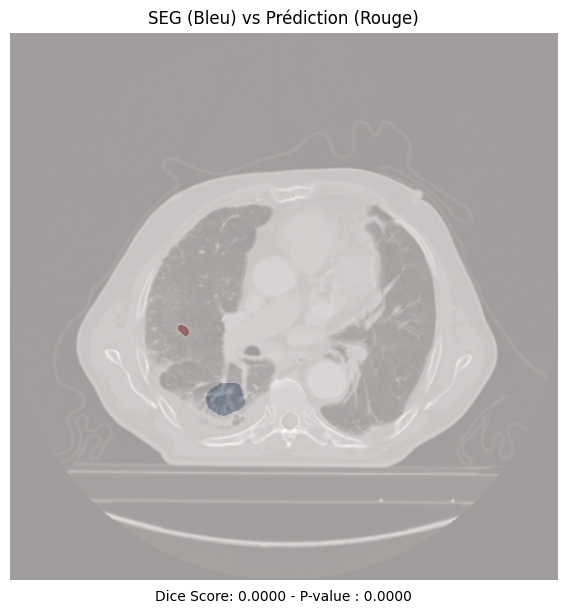

1


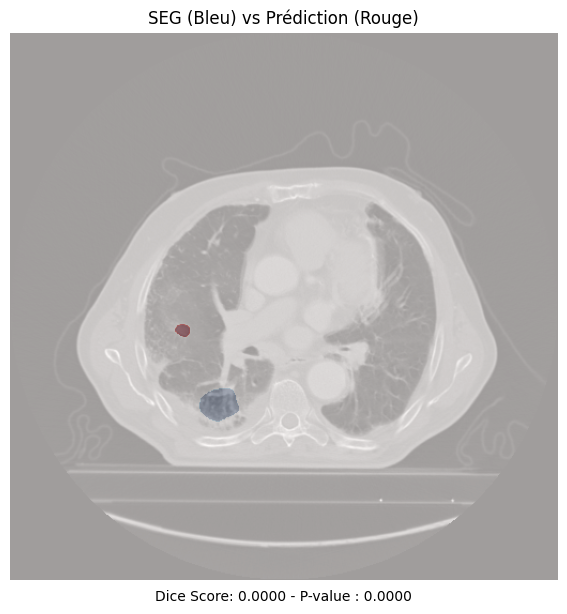

2


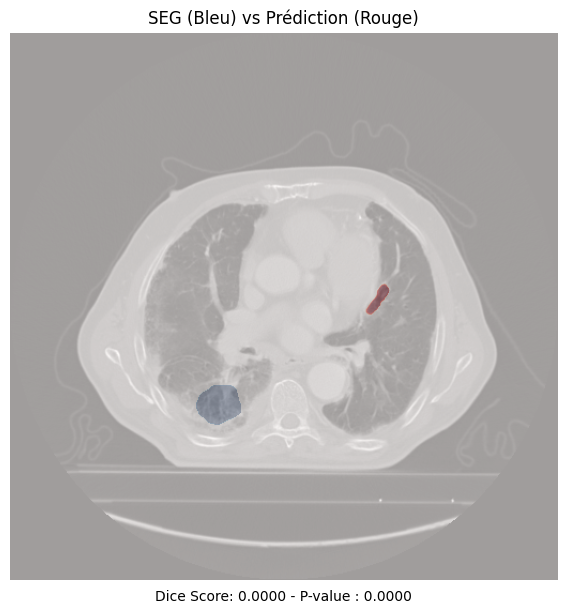

3


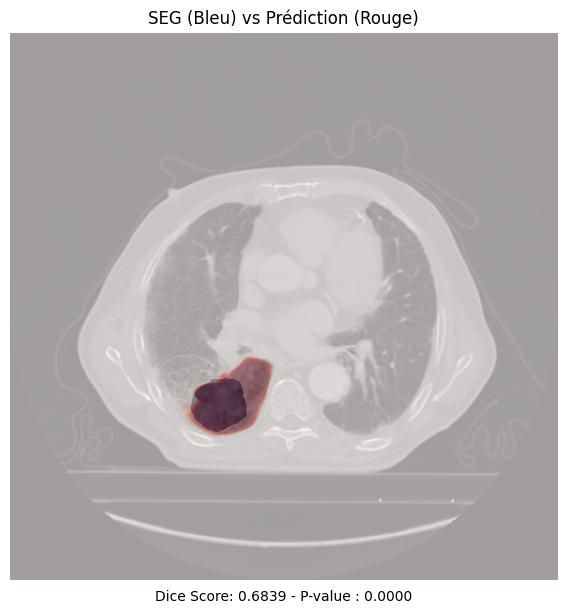

4


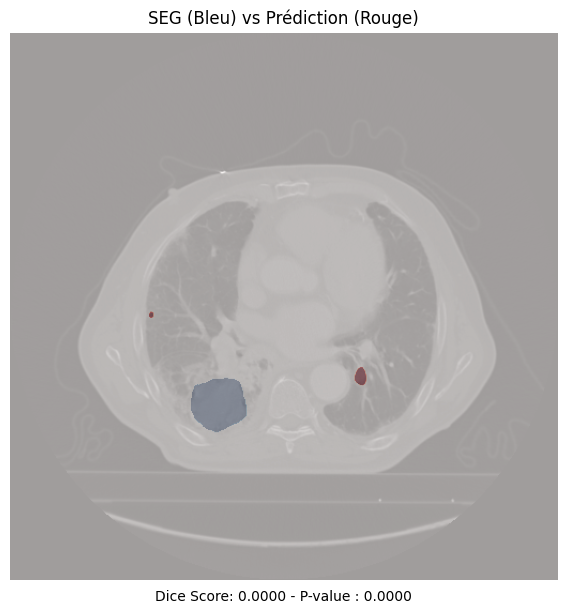

5


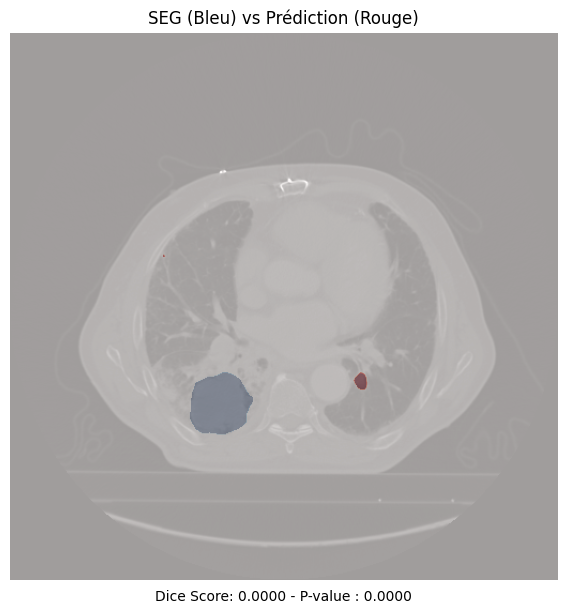

6


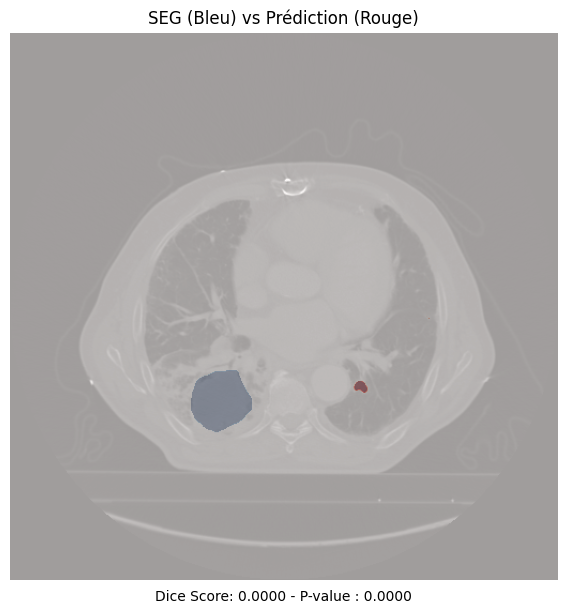

7


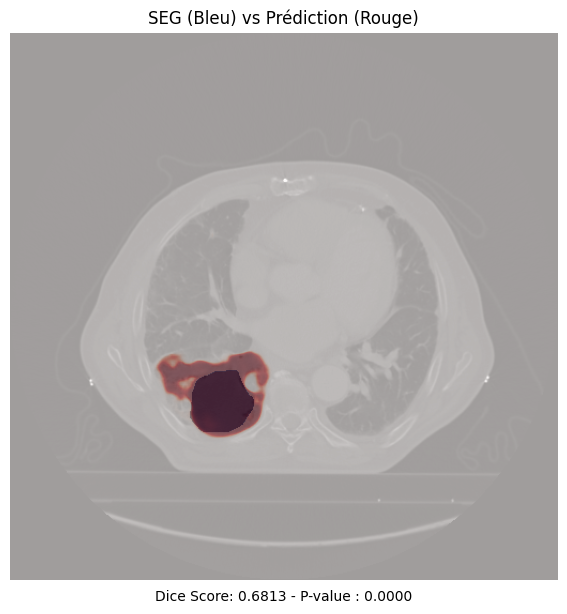

8


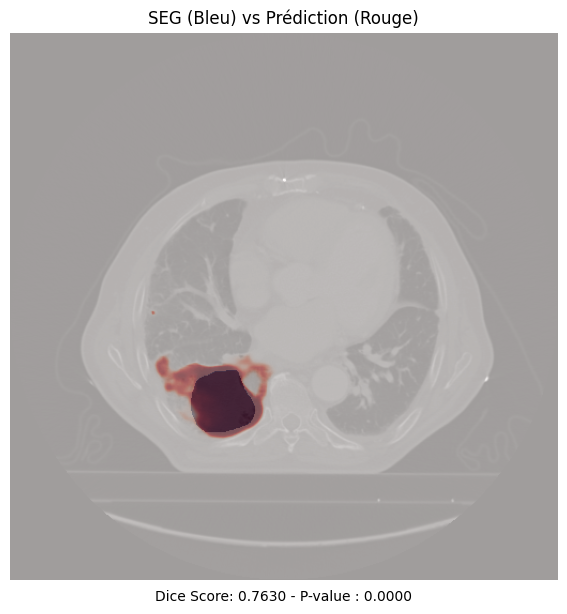

9


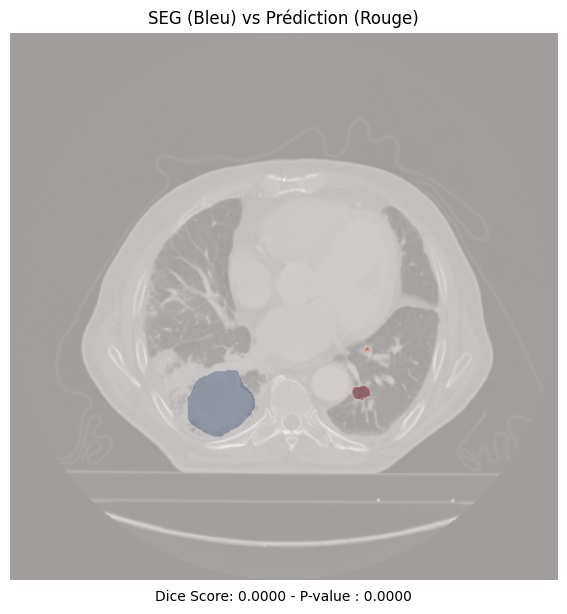

10


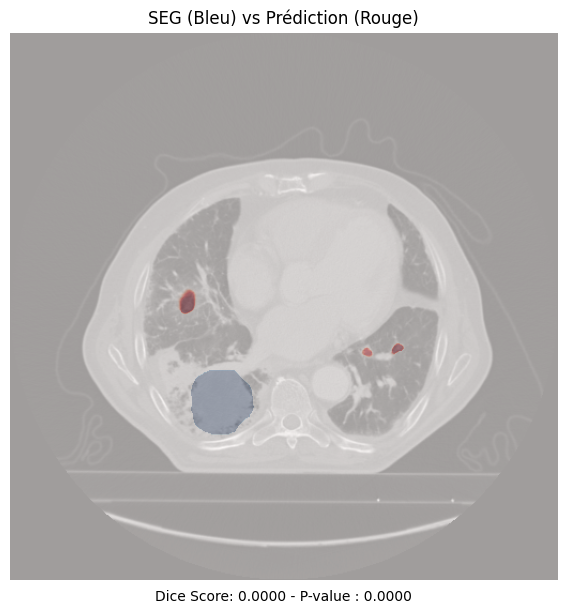

11


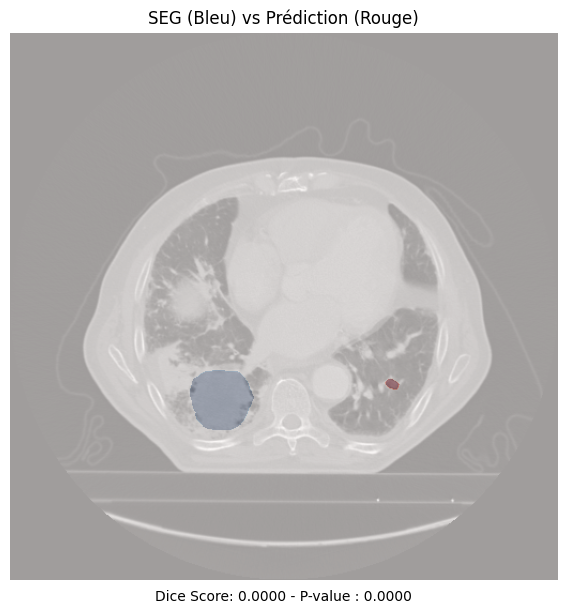

12


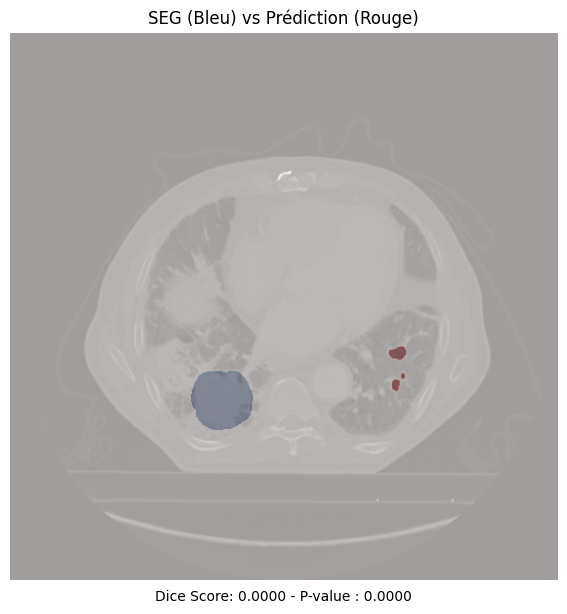

13


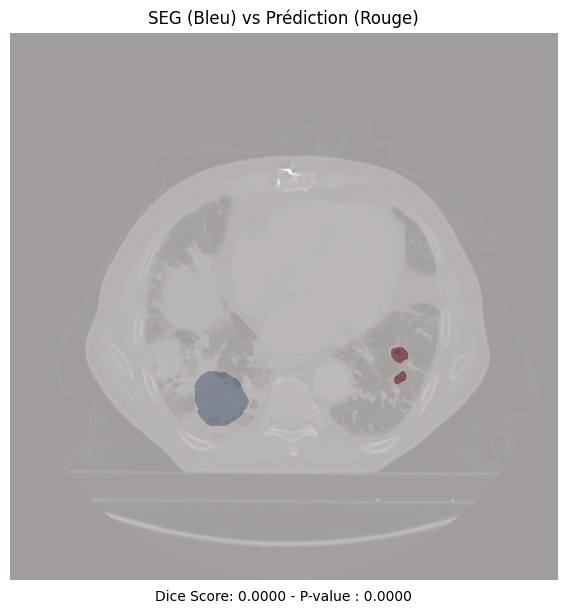

14


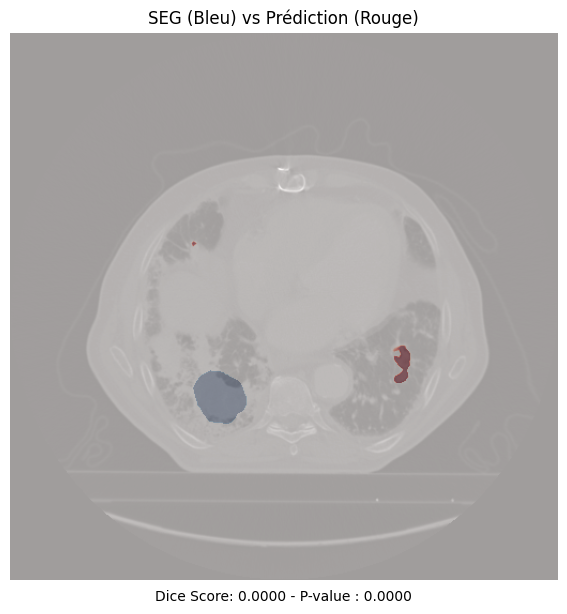

15


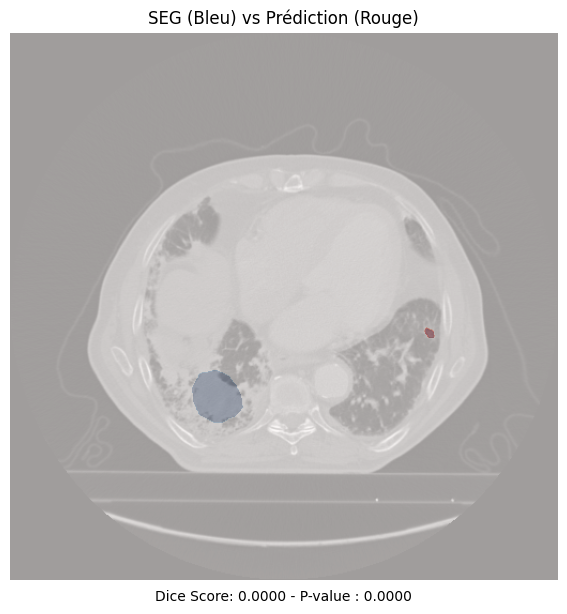

16


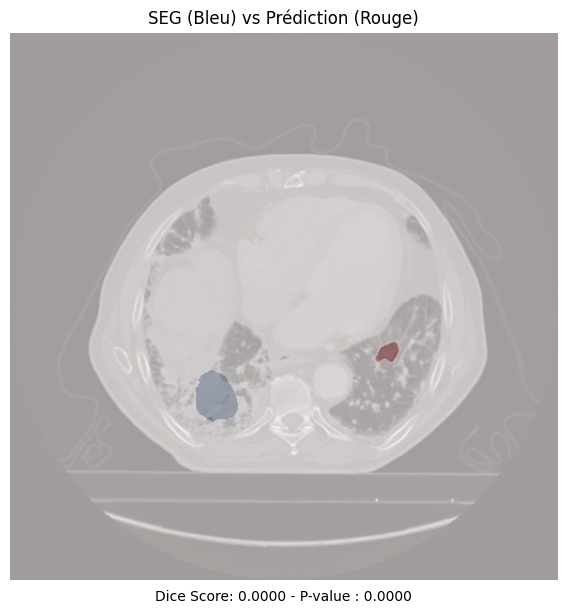

17


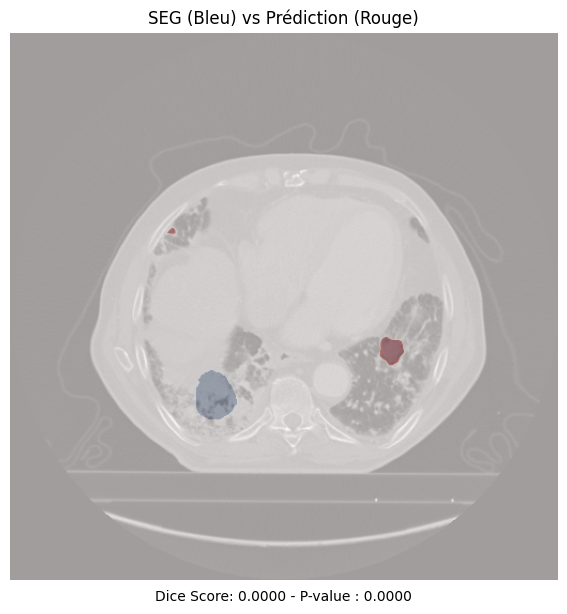

18


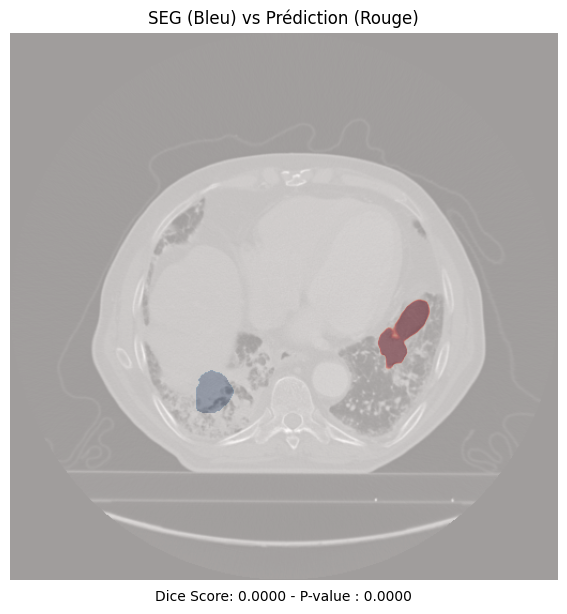

19


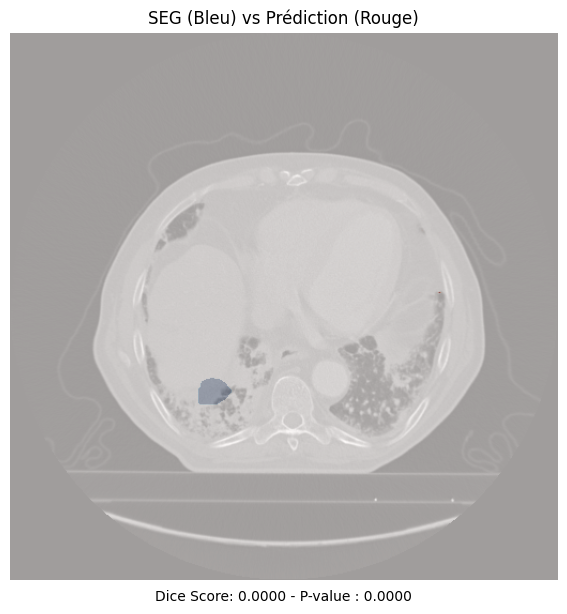

20


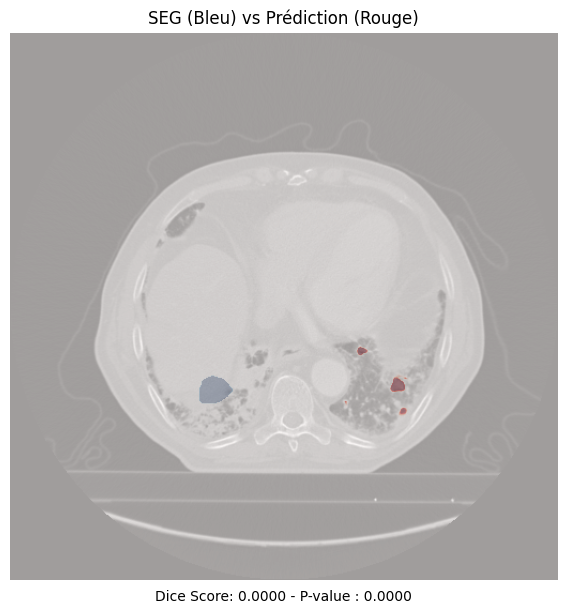

21


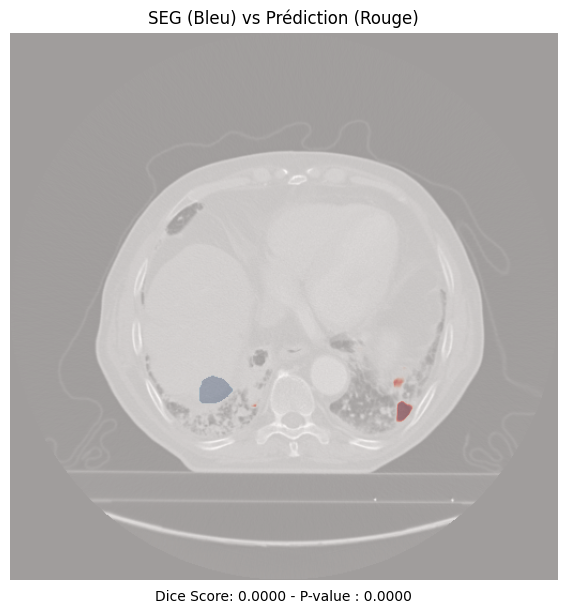

In [ ]:
import pydicom
import numpy as np
import cv2

def diceScore(mask1,mask2):
    mask1 = (mask1 > 0.5).astype(np.uint8)
    mask2 = (mask2 > 0.5).astype(np.uint8)

    intersection = np.sum(mask1 * mask2)
    tot = np.sum(mask1) + np.sum(mask2)

    res = 0

    if tot != 0 :
        res = ( 2.0 * intersection ) / tot

    return res

def get_target_segment_number(seg, keyword="neoplasm"):
    for s in seg.SegmentSequence:
        if keyword.lower() in s.SegmentLabel.lower():
            return s.SegmentNumber
    raise ValueError(f"Aucun segment contenant '{keyword}' trouvé dans le fichier de segmentation.")

text_prompt = ['tumor']

def showInference(patient):

    images_dir = f"./test/dcm/{patient}/0/"       # Dossier contenant les fichiers DICOM image
    seg_path = f"./test/dcm/{patient}/1/1-1.dcm"  # Fichier de segmentation DICOM SEG

    dicom_files = sorted(os.listdir(images_dir))
    image_slices = [pydicom.dcmread(os.path.join(images_dir, f)) for f in dicom_files]

    seg = pydicom.dcmread(seg_path)
    n_frames = int(seg.NumberOfFrames)
    # print(n_frames)


    ref_uids = [ref.ReferencedSOPInstanceUID for ref in seg.ReferencedSeriesSequence[0].ReferencedInstanceSequence]

    # print(seg.SegmentSequence)
    # print(seg.PerFrameFunctionalGroupsSequence)

    segmentsLabels = {
        s.SegmentNumber: s.SegmentLabel
        for s in seg.SegmentSequence
    }

    # for num, label in segmentsLabels.items():
    #     print(f"{num} → {label}")

    # target_segment_number = 2  # on segmente la tumeur (neoplasm)

    target_segment_number = get_target_segment_number(seg)

    masks = []
    uids = []

    for i, f in enumerate(seg.PerFrameFunctionalGroupsSequence):
        if int(f.SegmentIdentificationSequence[0].ReferencedSegmentNumber) == target_segment_number:
            masks.append(seg.pixel_array[i])
            uids.append(f.DerivationImageSequence[0].SourceImageSequence[0].ReferencedSOPInstanceUID)

    for dicom_file, img_dcm in zip(sorted(os.listdir(images_dir)), image_slices):
        sop_uid = img_dcm.SOPInstanceUID
        img_path = os.path.join(images_dir, dicom_file)

        image, pred_mask = inference_dicom(img_path, text_prompt, is_CT=True, site='lung')
        pred_mask = np.squeeze(pred_mask)
        pv=0

        if sop_uid in uids:
            seg_idx = uids.index(sop_uid)
            seg_mask = masks[seg_idx]
        else:
            seg_mask = np.zeros_like(img_dcm.pixel_array)

        img_array = img_dcm.pixel_array

        target_size = img_array.shape[::-1]  
        pred_mask_resized = cv2.resize(pred_mask, target_size, interpolation=cv2.INTER_NEAREST)

        dice = diceScore(pred_mask_resized, seg_mask)

        print(sorted(os.listdir(images_dir)).index(dicom_file))

        plt.figure(figsize=(6, 6))
        plt.imshow(img_array, cmap='gray')
        plt.imshow(seg_mask, alpha=0.4, cmap='Blues')
        plt.imshow(pred_mask_resized, alpha=0.4, cmap='Reds')

        plt.axis('off')
        plt.title("SEG (Bleu) vs Prédiction (Rouge)")

        plt.figtext(0.5, -0.01, f"Dice Score: {dice:.4f} ", wrap=True, ha='center', fontsize=10)

        plt.tight_layout()
        plt.show()


showInference(15)



### DICE SCORE

Formule du Dice score : 
$$
\text{Dice} = \frac{2 \cdot |A \cap B|}{|A| + |B|}
$$
où ${|A|}$ représente le nombre de pixel de A.

<p>Les codes suivants sont à adapter à la bdd considérer. Il faut regarder quel étiquette la bdd donne aux tumeur pour pouvoir les cibler. Dans celle utilisé dans ce notebook l'étiquette est 'neoplasm'. </p>

Patient 0 → Dice moyen : 0.0521
Patient 1 → Dice moyen : 0.1090
Patient 10 → Dice moyen : 0.6249
Patient 11 → Dice moyen : 0.0245
Patient 14 → Dice moyen : 0.8035
Patient 15 → Dice moyen : 0.0967
Patient 16 → Dice moyen : 0.0308
Patient 17 → Dice moyen : 0.3263
Patient 18 → Dice moyen : 0.0070
Patient 19 → Dice moyen : 0.0719
Patient 2 → Dice moyen : 0.3066
Patient 20 → Dice moyen : 0.7679
Patient 21 → Dice moyen : 0.4781
Patient 22 → Dice moyen : 0.1551
Patient 23 → Dice moyen : 0.6757
Patient 24 → Dice moyen : 0.1868
Patient 25 → Dice moyen : 0.2095
Patient 26 → Dice moyen : 0.0000
Patient 27 → Dice moyen : 0.7414
Patient 29 → Dice moyen : 0.0036
Patient 3 → Dice moyen : 0.5221
Patient 30 → Dice moyen : 0.0508
Patient 31 → Dice moyen : 0.8077
Patient 32 → Dice moyen : 0.0000
Patient 33 → Dice moyen : 0.2361
Patient 34 → Dice moyen : 0.2091
Patient 36 → Dice moyen : 0.4660
Patient 37 → Dice moyen : 0.5169
Patient 38 → Dice moyen : 0.7729
Patient 39 → Dice moyen : 0.1351
Patient 4 → Di

/tmp/ipykernel_1950035/1331643094.py:72: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(all_patient_scores, vert=True, patch_artist=True, labels=["Dice moyen par patient"])


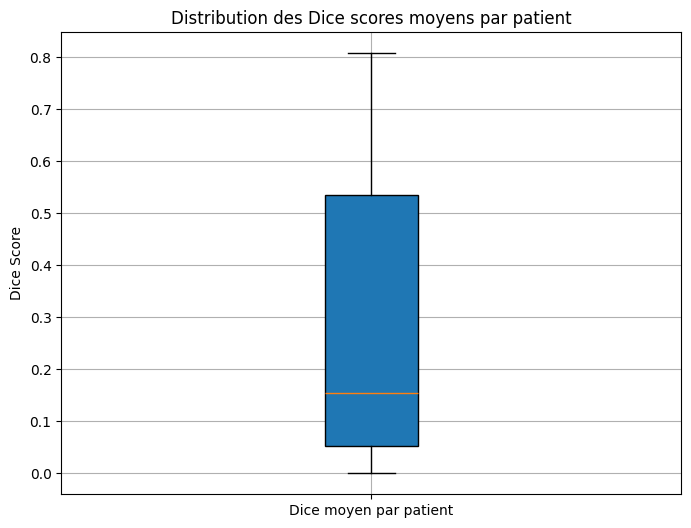

In [12]:
import os
import pydicom
import numpy as np
import matplotlib.pyplot as plt
import cv2

all_patient_scores = []

base_path = "./test/dcm/"
patients = sorted([p for p in os.listdir(base_path) if os.path.isdir(os.path.join(base_path, p))])

for patient_id in patients:
    images_dir = os.path.join(base_path, patient_id, "0")
    seg_path = os.path.join(base_path, patient_id, "1", "1-1.dcm")

    # Skip patient if segmentation file is missing
    if not os.path.exists(seg_path):
        print(f"[WARN] No segmentation file for patient {patient_id}")
        continue

    # Lire les images DICOM
    dicom_files = sorted(os.listdir(images_dir))
    image_slices = [pydicom.dcmread(os.path.join(images_dir, f)) for f in dicom_files]

    # Lire segmentation DICOM SEG
    seg = pydicom.dcmread(seg_path)
    try :
        target_segment_number = get_target_segment_number(seg)
    except Exception as e:
        print(f"Erreur avec le patient {patient_id}: {e}")
        continue

    # Extraire masques SEG
    uids = []
    masks = []
    for i, f in enumerate(seg.PerFrameFunctionalGroupsSequence):
        if int(f.SegmentIdentificationSequence[0].ReferencedSegmentNumber) == target_segment_number:
            masks.append(seg.pixel_array[i])
            uids.append(f.DerivationImageSequence[0].SourceImageSequence[0].ReferencedSOPInstanceUID)

    uid_to_seg = {uid: mask for uid, mask in zip(uids, masks)}

    # Calcul des Dice pour chaque slice
    scores = []
    for dicom_file, img_dcm in zip(dicom_files, image_slices):
        sop_uid = img_dcm.SOPInstanceUID
        img_path = os.path.join(images_dir, dicom_file)
        img_array = img_dcm.pixel_array
        h, w = img_array.shape

        # Prédiction modèle
        _, pred_mask = inference_dicom(img_path, ['tumor'], is_CT=True, site='lung')
        pred_mask = np.squeeze(pred_mask)
        pred_mask_resized = cv2.resize(pred_mask, (w, h), interpolation=cv2.INTER_NEAREST)

        # Masque SEG 
        seg_mask = uid_to_seg.get(sop_uid, np.zeros_like(img_array))

        # Dice score
        score = diceScore(pred_mask_resized, seg_mask)
        scores.append(score)

    if scores:
        mean_score = np.mean(scores)
        all_patient_scores.append(mean_score)
        print(f"Patient {patient_id} → Dice moyen : {mean_score:.4f}")
    else:
        print(f"[INFO] Patient {patient_id} → Aucun score calculé (masques absents)")

# --- Boxplot global ---
plt.figure(figsize=(8, 6))
plt.boxplot(all_patient_scores, vert=True, patch_artist=True, labels=["Dice moyen par patient"])
plt.ylabel("Dice Score")
plt.title("Distribution des Dice scores moyens par patient")
plt.grid(True)
plt.show()


In [13]:
m = np.mean(all_patient_scores)
print(f"Moyenne : {m}")

Moyenne : 0.29468434365968676


<h2>Évaluation qualitative des prédictions par Dice Score (après filtrage)</h2>

<p>
Ce bloc évalue la qualité des masques prédits par le modèle en les comparant aux masques de référence issus des fichiers de segmentation DICOM-SEG, à l’aide du Dice Score.
</p>

<h3>Méthodologie :</h3>
<ul>
  <li>Pour chaque patient, toutes les images DICOM sont traitées par le modèle pour générer un masque de prédiction.</li>
  <li>Les masques sont ensuite filtrés par cohérence : on utilise un double tri basé sur le score de similarité (auto-Dice) entre masques prédits.</li>
  <li>Les masques conservés sont comparés à leur équivalent dans la vérité terrain (si disponible) pour calculer un Dice Score moyen par patient.</li>
</ul>

<h3>Résultat :</h3>
<p>
Les scores moyens sont affichés pour chaque patient, puis visualisés globalement dans un boxplot afin d’évaluer la performance globale du modèle.
</p>

<h3>Hypothèse :</h3>
<p>
L’algorithme repose sur l’hypothèse que la majorité des prédictions sont correctes. Le filtrage permet donc d’exclure automatiquement les masques aberrants sans avoir besoin de la vérité terrain.
</p>


Patient 0 → Dice moyen final : 0.3988
Patient 1 → Dice moyen final : 0.4588
Patient 10 → Dice moyen final : 0.8393
Patient 11 → Dice moyen final : 0.0000
Patient 14 → Dice moyen final : 0.9433
Patient 15 → Dice moyen final : 0.0000
Patient 16 → Dice moyen final : 0.0000
Patient 17 → Dice moyen final : 0.8207
Patient 18 → Dice moyen final : 0.0133
Patient 19 → Dice moyen final : 0.0000
Patient 2 → Dice moyen final : 0.1846
Patient 20 → Dice moyen final : 0.8388
Patient 21 → Dice moyen final : 0.7300
Patient 22 → Dice moyen final : 0.6866
Patient 23 → Dice moyen final : 0.8799
Patient 24 → Dice moyen final : 0.5408
Patient 25 → Dice moyen final : 0.8824
Patient 26 → Dice moyen final : 0.0000
Patient 27 → Dice moyen final : 0.7714
Patient 29 → Dice moyen final : 0.0000
Patient 3 → Dice moyen final : 0.7769
Patient 30 → Dice moyen final : 0.3191
Patient 31 → Dice moyen final : 0.9002
Patient 32 → Dice moyen final : 0.0000
Patient 33 → Dice moyen final : 0.8741
Patient 34 → Dice moyen final

/tmp/ipykernel_2793738/3279149783.py:116: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(final_patient_scores, vert=True, patch_artist=True, labels=["Dice moyens (après filtrage)"])


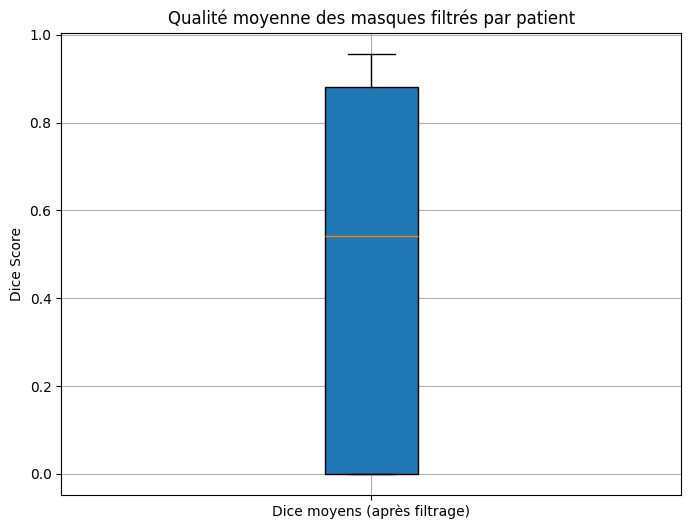

In [ ]:
import os
import numpy as np
import pydicom
import matplotlib.pyplot as plt
import cv2

def diceScore(mask1, mask2):
    mask1 = (mask1 > 0.5).astype(np.uint8)
    mask2 = (mask2 > 0.5).astype(np.uint8)
    intersection = np.sum(mask1 * mask2)
    total = np.sum(mask1) + np.sum(mask2)
    if total != 0:
        return (2.0 * intersection) / total
    return 0

def dsSort(masks, images, filenames, tr):
    n = len(masks)
    ds = []
    for i, mask1 in enumerate(masks):
        total = 0
        for j, mask2 in enumerate(masks):
            if i != j:
                total += diceScore(mask1, mask2)
        ds.append(total / (n - 1))
    
    # Trier les masques selon leur score moyen
    s = sorted(zip(ds, images, masks, filenames), key=lambda x: x[0])
    cutoff = int(tr * n / 100)
    kept = s[cutoff:]  # On garde les meilleurs
    return list(zip(*kept))  # ds, images, masks, filenames

# Path des patients
base_path = "./test/dcm/"
patients = sorted([p for p in os.listdir(base_path) if os.path.isdir(os.path.join(base_path, p))])

# Résultats Dice moyens finaux
final_patient_scores = []

for patient_id in patients:
    images_dir = os.path.join(base_path, patient_id, "0")
    seg_path = os.path.join(base_path, patient_id, "1", "1-1.dcm")

    if not os.path.exists(seg_path):
        print(f"[WARN] Pas de fichier SEG pour patient {patient_id}")
        continue

    dicom_files = sorted(os.listdir(images_dir))
    image_slices = [pydicom.dcmread(os.path.join(images_dir, f)) for f in dicom_files]

    seg = pydicom.dcmread(seg_path)
    try :
        target_segment_number = get_target_segment_number(seg)
    except Exception as e:
        print(f"Erreur avec le patient {patient_id}: {e}")
        continue

    uids = []
    masks_seg = []
    for i, f in enumerate(seg.PerFrameFunctionalGroupsSequence):
        if int(f.SegmentIdentificationSequence[0].ReferencedSegmentNumber) == target_segment_number:
            masks_seg.append(seg.pixel_array[i])
            uids.append(f.DerivationImageSequence[0].SourceImageSequence[0].ReferencedSOPInstanceUID)

    uid_to_seg = {uid: mask for uid, mask in zip(uids, masks_seg)}

    images = []
    pred_masks = []
    filenames = []
    sop_uids = []

    for dicom_file, img_dcm in zip(dicom_files, image_slices):
        sop_uid = img_dcm.SOPInstanceUID
        img_path = os.path.join(images_dir, dicom_file)
        img_array = img_dcm.pixel_array
        h, w = img_array.shape

        _, pred_mask = inference_dicom(img_path, ['tumor'], is_CT=True, site='lung')
        pred_mask = np.squeeze(pred_mask)
        pred_mask_resized = cv2.resize(pred_mask, (w, h), interpolation=cv2.INTER_NEAREST)

        images.append(img_array)
        pred_masks.append(pred_mask_resized)
        filenames.append(dicom_file)
        sop_uids.append(sop_uid)

    if len(pred_masks) < 3:
        print(f"[INFO] Patient {patient_id} ignoré (trop peu de masques)")
        continue

    # tri par auto-dice (50% les meilleurs)
    it1 = dsSort(pred_masks, images, filenames, tr=50)
    if len(it1[0]) < 2:
        continue
    # retri des meilleurs restants
    ds_final, imgs_final, masks_final, filenames_final = dsSort(it1[2], it1[1], it1[3], tr=50)

    # Calcul du Dice réel )
    scores = []
    for filename, pred_mask in zip(filenames_final, masks_final):
        # Retrouver le SOPInstanceUID correspondant au fichier
        idx = dicom_files.index(filename)
        sop_uid = image_slices[idx].SOPInstanceUID

    if sop_uid in uid_to_seg:
        seg_mask = uid_to_seg[sop_uid]
        dice = diceScore(pred_mask, seg_mask)
        scores.append(dice)

    if scores:
        mean_dice = np.mean(scores)
        final_patient_scores.append(mean_dice)
        print(f"Patient {patient_id} → Dice moyen final : {mean_dice:.4f}")

# --- Boxplot global ---
plt.figure(figsize=(8, 6))
plt.boxplot(final_patient_scores, vert=True, patch_artist=True, labels=["Dice moyens (après filtrage)"])
plt.ylabel("Dice Score")
plt.title("Qualité moyenne des masques filtrés par patient")
plt.grid(True)
plt.show()


Moyenne après filtrage : 0.4785
Moyenne sur les patients validés : 0.7785
1 → Esophagus
2 → Neoplasm, Primary
3 → Heart
4 → Lung
5 → Lung
6 → Spinal cord
0


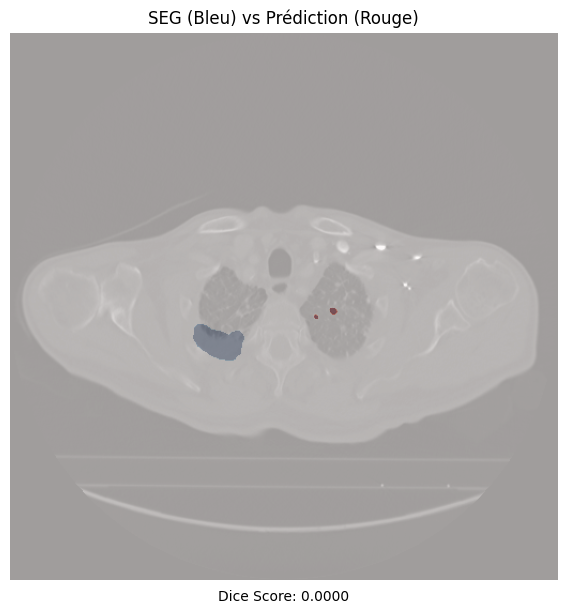

1


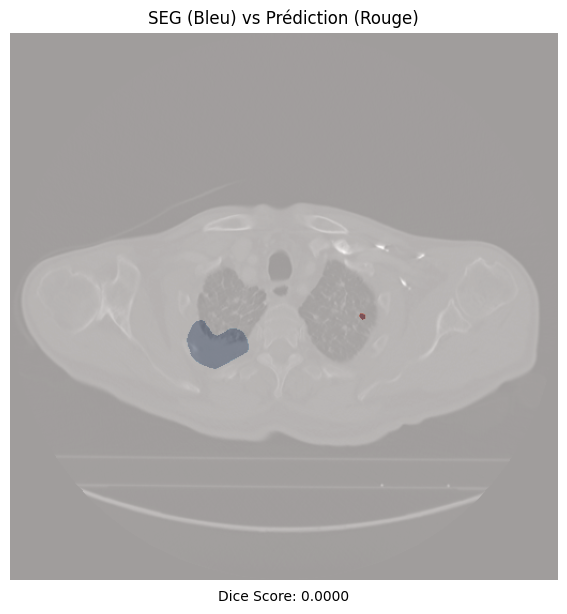

2


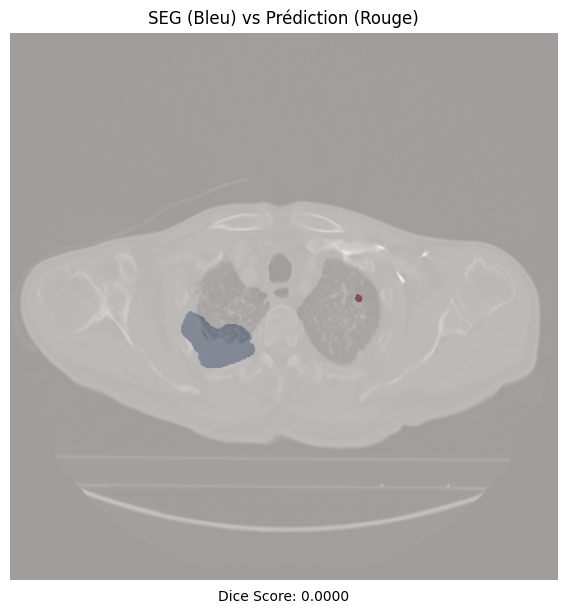

3


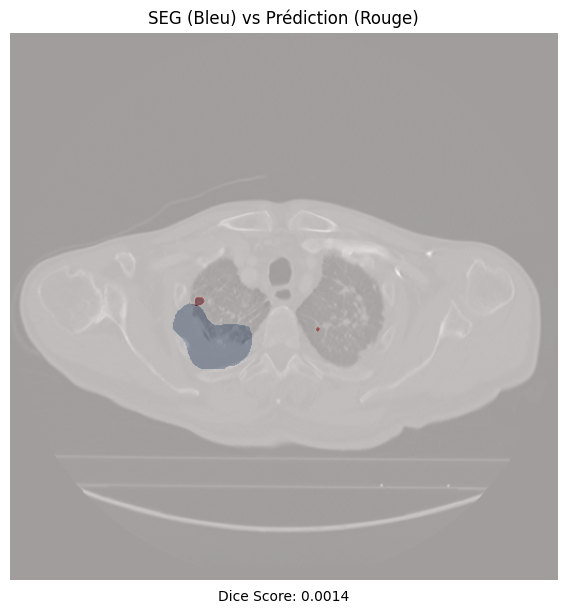

4


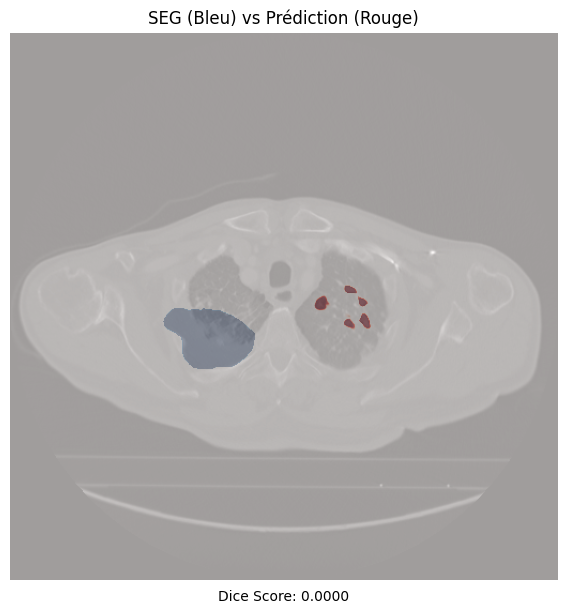

5


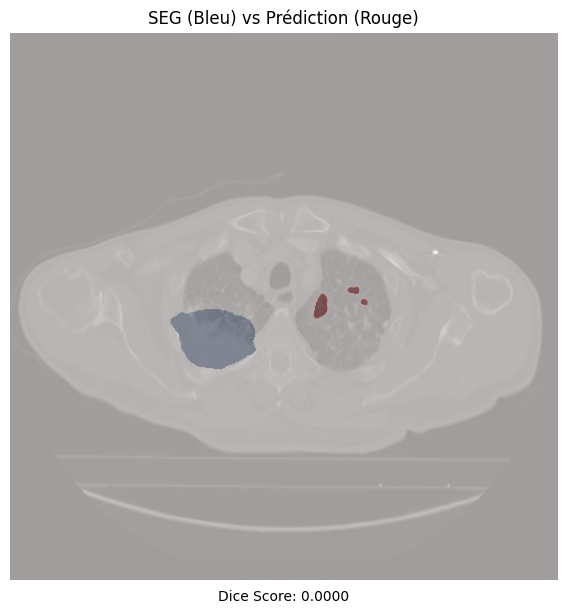

6


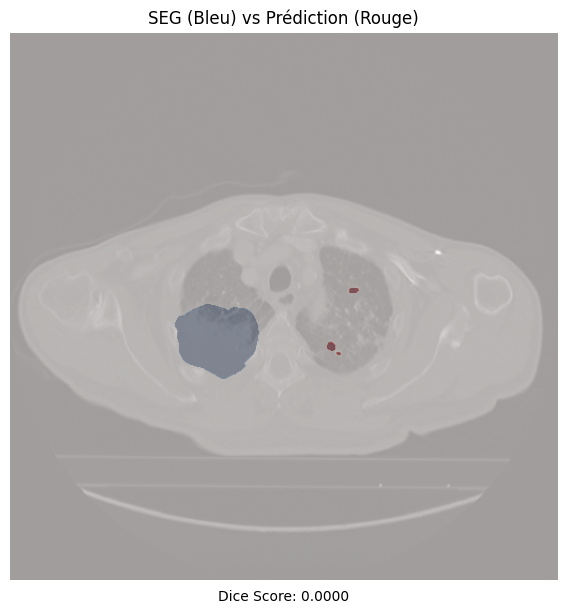

7


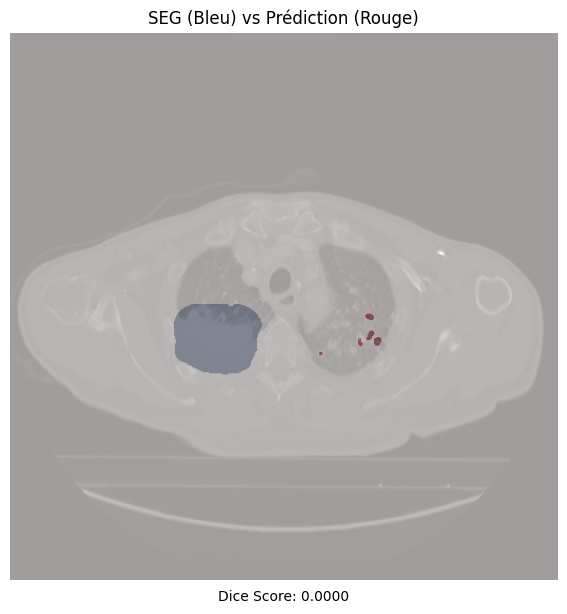

8


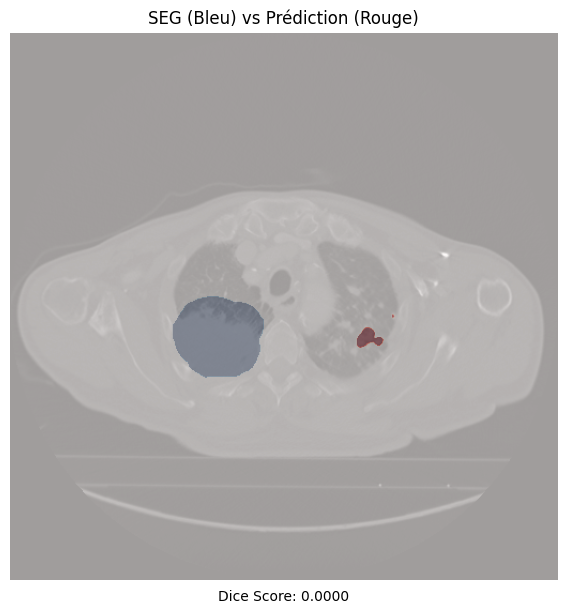

9


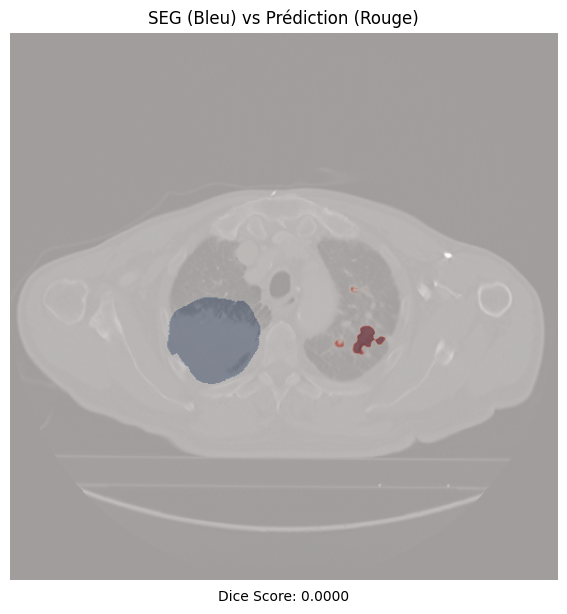

10


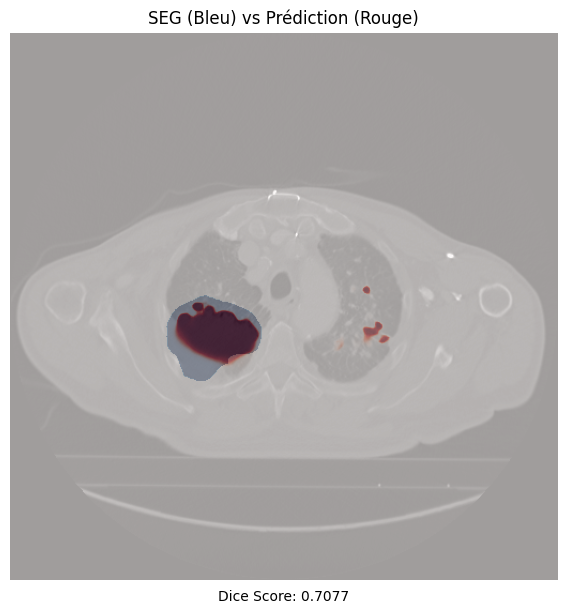

11


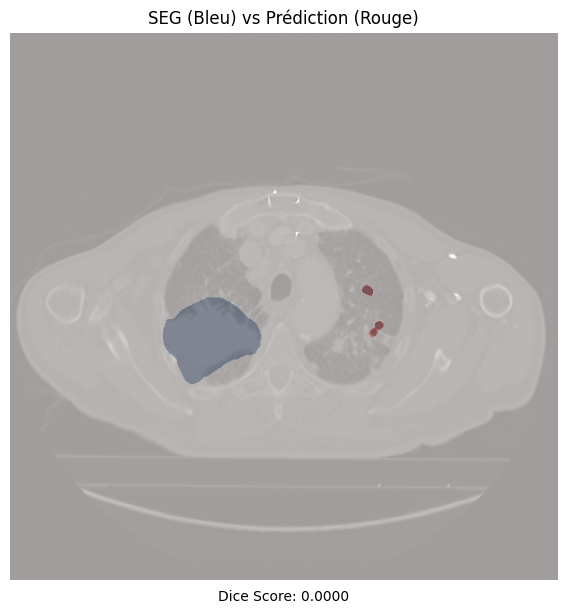

12


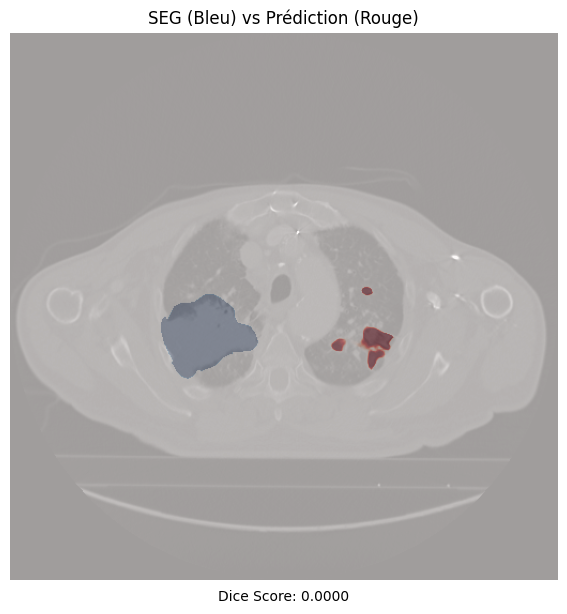

13


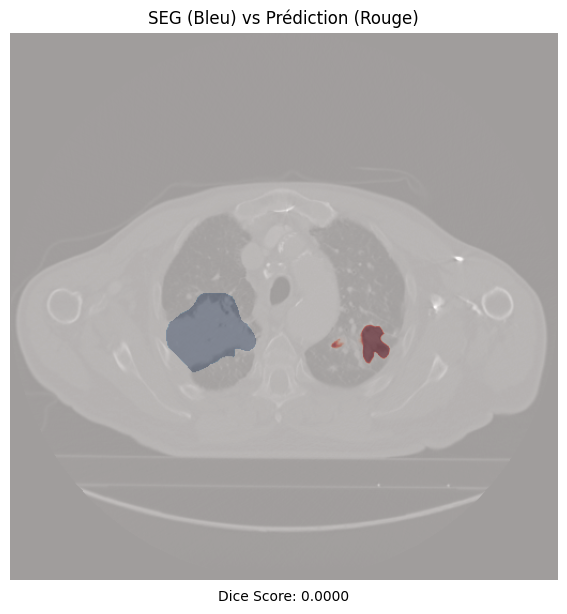

14


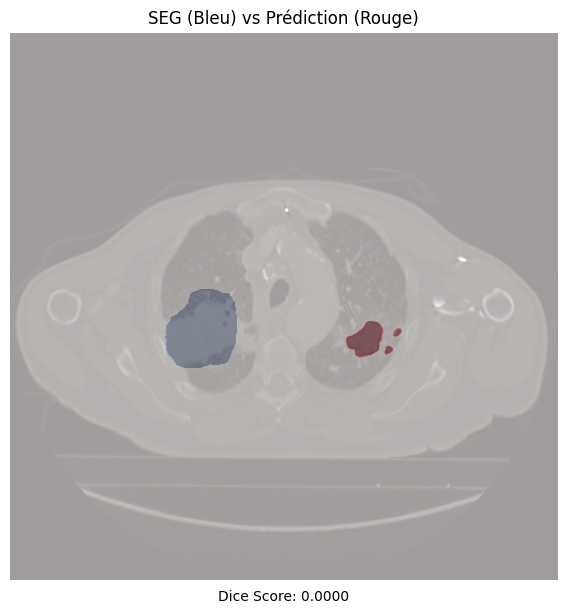

15


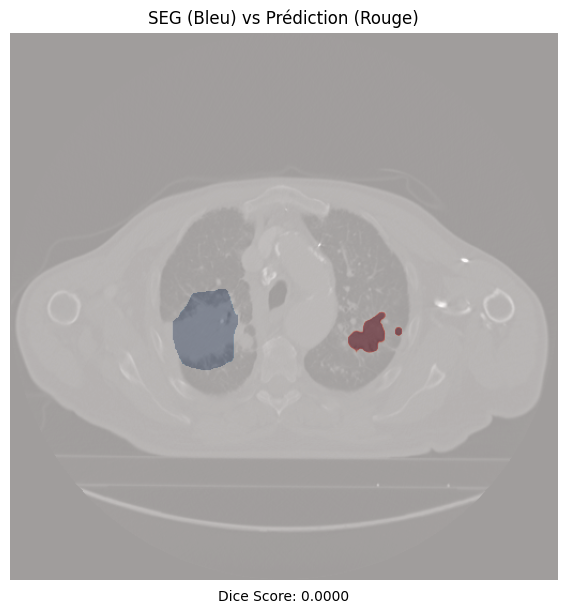

16


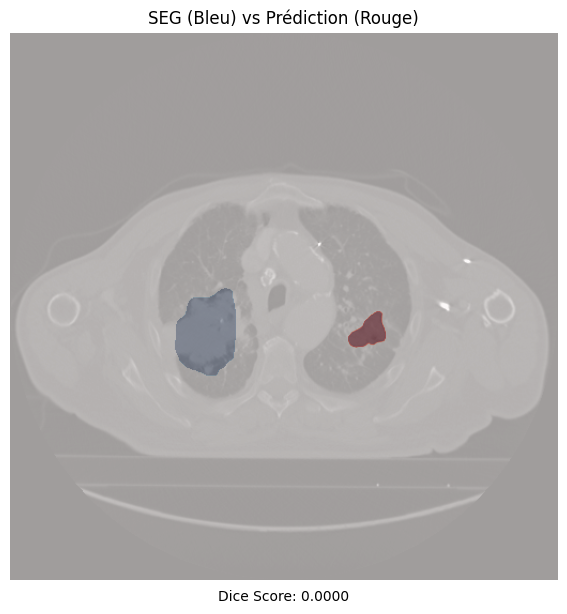

17


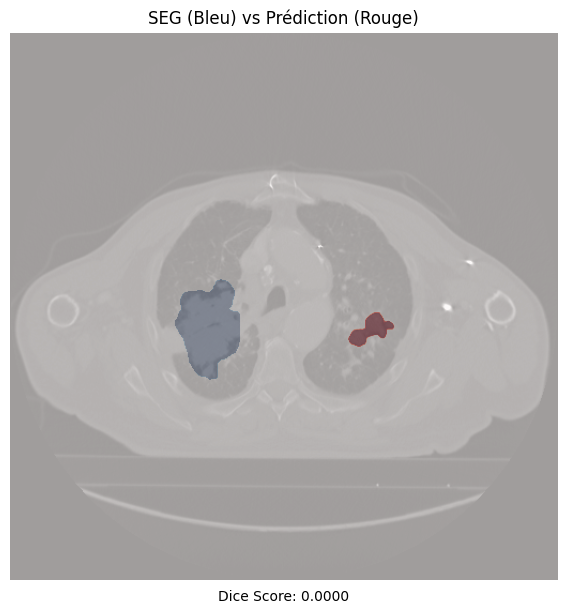

18


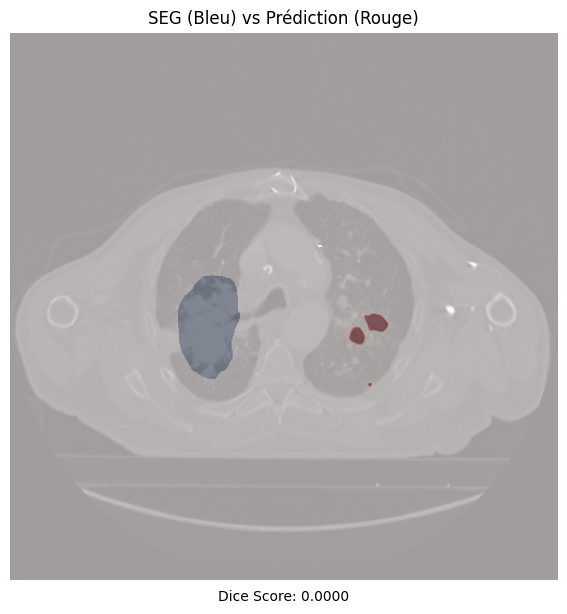

19


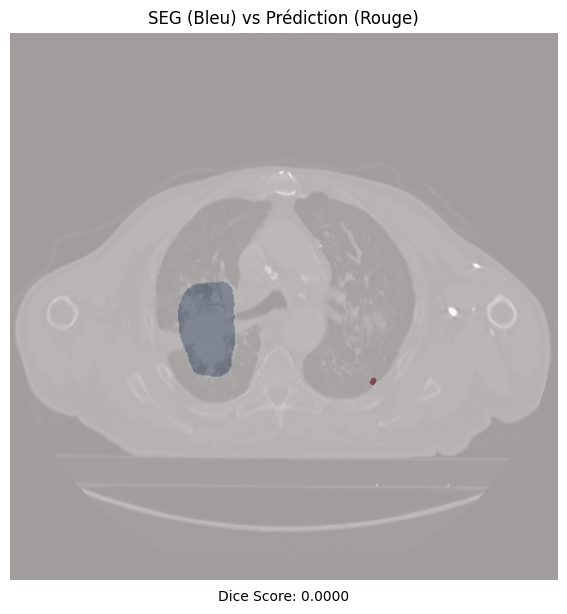

20


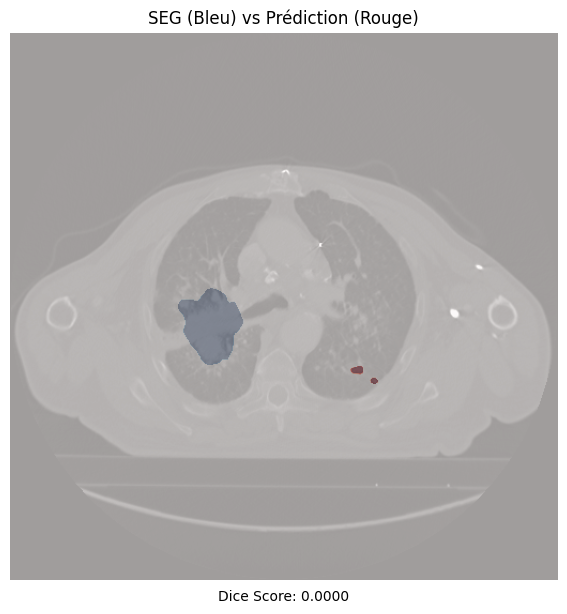

21


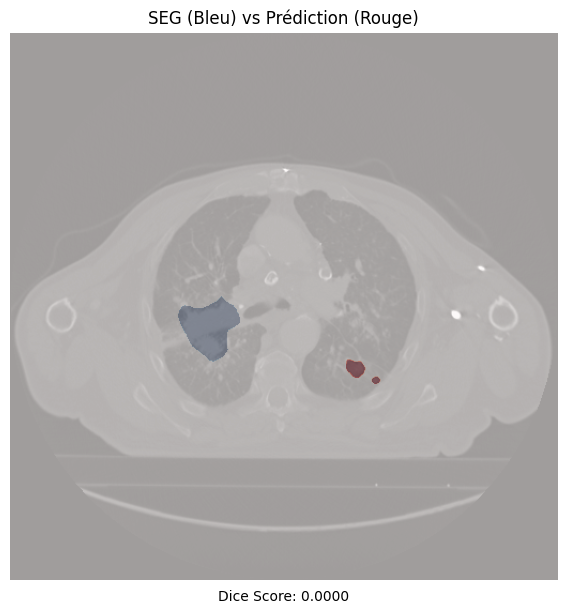

22


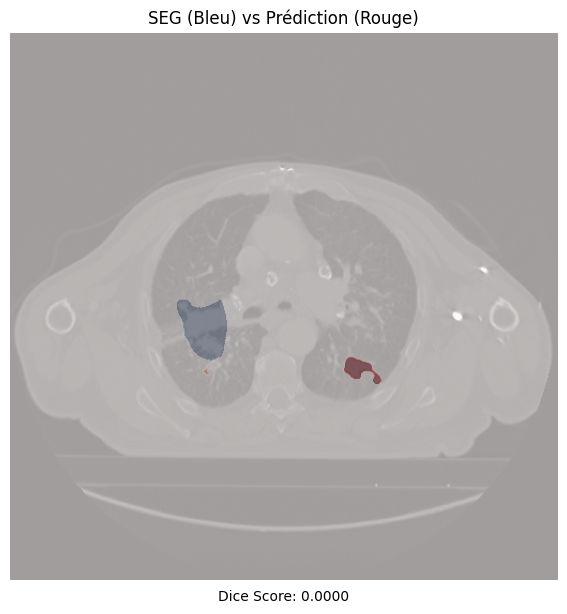

23


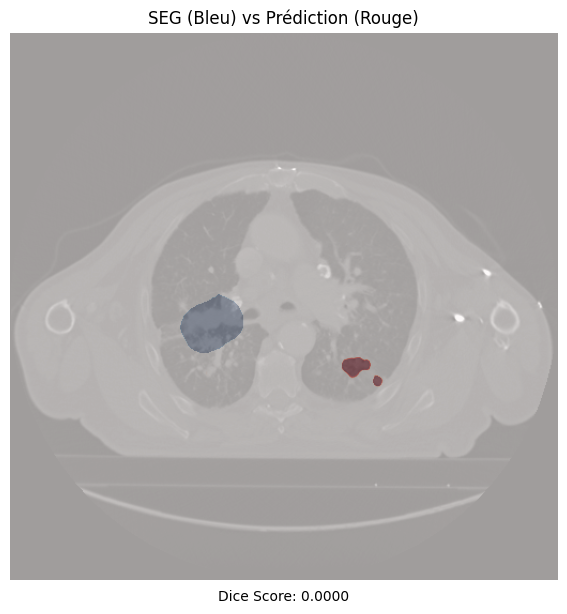

24


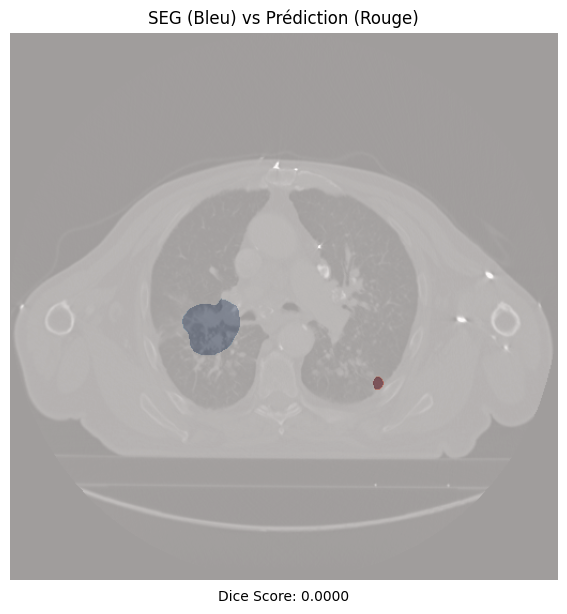

25


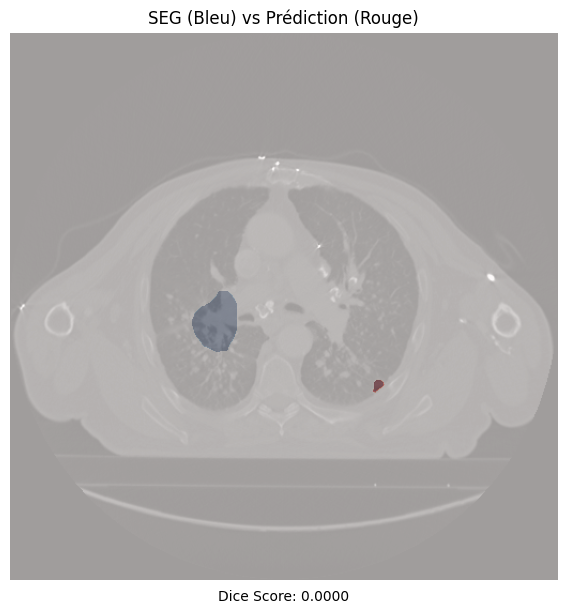

26


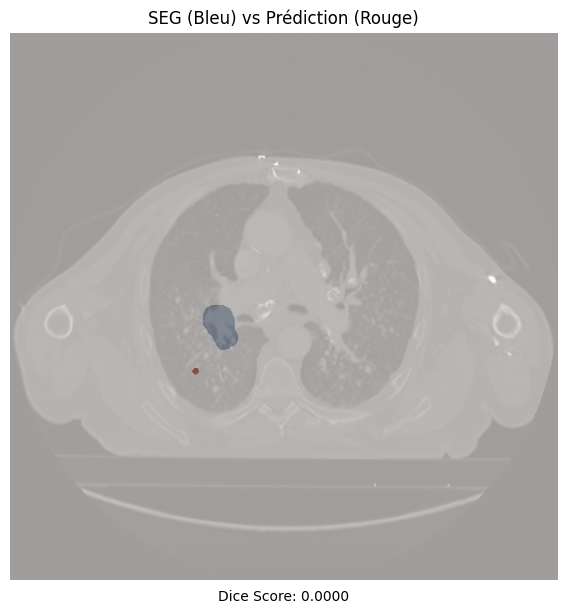

27


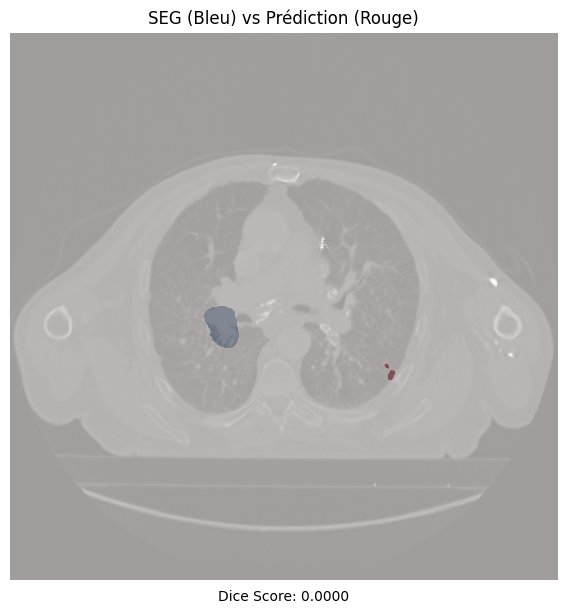

28


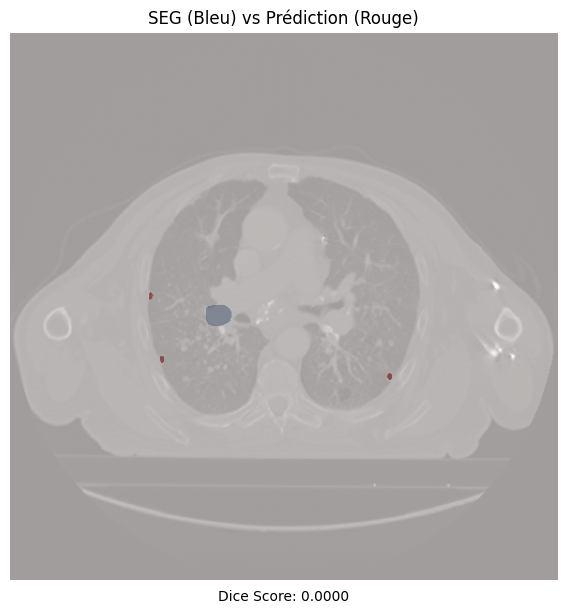

In [6]:
m = np.mean(final_patient_scores)
print(f"Moyenne après filtrage : {m:.4f}")

mauvais = []

for patient, score in zip(patients, final_patient_scores):
    if score < 0.3:
        # print(f"Patient {patient} - score : {score:.4f}")
        mauvais.append(patient)


patientOk = [p for p in patients if p not in mauvais]
patient_score_dict = dict(zip(patients, final_patient_scores))
filtered_scores = [patient_score_dict[p] for p in patientOk]

m_ok = np.mean(filtered_scores)

print(f"Moyenne sur les patients validés : {m_ok:.4f}")

showInference(mauvais[0])



<h4>Analyse des résultats</h4>
<p>
Avant tout filtrage, la moyenne des Dice scores par patient était relativement faible, à <strong>0.29</strong>, traduisant une qualité globale limitée des masques. 
Après application de l’algorithme de tri par cohérence, cette moyenne monte à <strong>0.48</strong>, indiquant une amélioration significative grâce à l’élimination automatique des masques peu fiables.
</p>
<p>
En restreignant l’analyse aux seuls patients pour lesquels le modèle produit des masques cohérents (i.e. score moyen &gt; 0.3), la moyenne atteint <strong>0.78</strong>, ce qui reflète une excellente concordance entre prédiction et vérité terrain pour ces cas filtrés.
</p>


<h2>Application du critère RECIST : Mesurabilité de la lésion</h2>

<p>
Dans cette section, nous passons de l’évaluation de la qualité des masques de segmentation à l’objectif final du modèle au sein de notre système multi-agent : <strong>déterminer automatiquement si une tumeur est mesurable selon le critère RECIST</strong>.
</p>

<p>
Le critère <strong>RECIST (Response Evaluation Criteria In Solid Tumors)</strong> est une norme utilisée en oncologie pour évaluer la réponse des tumeurs aux traitements. Il impose un seuil minimal de taille — généralement <strong>10 mm</strong> — pour qu’une lésion soit considérée comme « mesurable », condition préalable à l’éligibilité du patient à certains essais cliniques.
</p>

<p>
Le code ci-dessous exploite les fichiers DICOM-SEG (vérité terrain) pour détecter les lésions, extraire leur taille maximale (en mm, via les <code>PixelSpacing</code>), et juger de leur mesurabilité. Ce bloc constitue donc une première étape vers l'automatisation complète de la sélection des patients pour les essais cliniques, basée sur des critères d'imagerie standardisés.
</p>


In [7]:
import os
import pydicom
import numpy as np
import cv2
from scipy.spatial.distance import pdist, squareform

def measure_size_native(p1, p2, pixel_spacing):
    dx = pixel_spacing[1]  # col spacing
    dy = pixel_spacing[0]  # row spacing
    delta = np.array([(p1[0] - p2[0]) * dy, (p1[1] - p2[1]) * dx])  # (y, x)
    return np.linalg.norm(delta)

def get_target_segment_number(seg, keyword="neoplasm"):
    for s in seg.SegmentSequence:
        if keyword.lower() in s.SegmentLabel.lower():
            return s.SegmentNumber
    raise ValueError(f"Aucun segment contenant '{keyword}' trouvé dans le fichier de segmentation.")

def recist_from_seg(base_path, seuil_mm=10.0):
    images_dir = os.path.join(base_path, "0")
    seg_path = os.path.join(base_path, "1", "1-1.dcm")

    if not os.path.exists(seg_path):
        raise FileNotFoundError(f"Pas de fichier SEG pour {base_path}")

    seg = pydicom.dcmread(seg_path)
    target_segment_number = get_target_segment_number(seg)

    # Extraire tous les masques du segment d’intérêt
    masks = []
    uids = []
    for i, f in enumerate(seg.PerFrameFunctionalGroupsSequence):
        if int(f.SegmentIdentificationSequence[0].ReferencedSegmentNumber) == target_segment_number:
            mask = seg.pixel_array[i]
            uid = f.DerivationImageSequence[0].SourceImageSequence[0].ReferencedSOPInstanceUID
            if mask.sum() > 0:
                masks.append(mask)
                uids.append(uid)

    uid_to_mask = dict(zip(uids, masks))

    # Lire les DICOM présents dans 0/ (ceux utilisés pour l’analyse)
    dicom_files = sorted(
        [os.path.join(images_dir, f) for f in os.listdir(images_dir)],
        key=lambda x: pydicom.dcmread(x, stop_before_pixels=True).InstanceNumber
    )

    max_lesion = {"size": 0.0, "slice": None}

    for path in dicom_files:
        dcm = pydicom.dcmread(path)
        sop_uid = dcm.SOPInstanceUID
        if sop_uid not in uid_to_mask:
            continue

        mask = uid_to_mask[sop_uid].astype(np.uint8)
        if mask.sum() == 0:
            continue

        pixel_spacing = getattr(dcm, 'PixelSpacing', [1.0, 1.0])
        instance_number = getattr(dcm, 'InstanceNumber', 0)

        contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        for contour in contours:
            points = contour[:, 0, :]
            if len(points) < 2:
                continue

            i, j = np.unravel_index(np.argmax(squareform(pdist(points))), (len(points), len(points)))
            p1, p2 = points[i], points[j]
            lesion_size_mm = measure_size_native(p1, p2, pixel_spacing)

            if lesion_size_mm > max_lesion["size"]:
                max_lesion = {"size": lesion_size_mm, "slice": instance_number}

    prediction = "Mesurable" if max_lesion["size"] > seuil_mm else "Non mesurable"

    return max_lesion["size"], prediction


# Chemin vers un dossier patient (structure : ./test/dcm/{patient_id}/0 et /1)
patient_id = "45"
base_path = f"./test/dcm/{patient_id}"

# Appel de la fonction RECIST
size_mm, prediction = recist_from_seg(base_path)

# Affichage du résultat
print(f"📌 Patient {patient_id}")
print(f"   ➤ Taille max de lésion : {size_mm:.2f} mm")
print(f"   ➤ Statut RECIST : {prediction}")



📌 Patient 45
   ➤ Taille max de lésion : 67.13 mm
   ➤ Statut RECIST : Mesurable


<h3>Évaluation RECIST sur les prédictions du modèle</h3>

<p>
Après avoir mesuré la taille des lésions à partir des masques de vérité terrain (DICOM-SEG), on applique à présent la même logique sur les <strong>masques issus de l’inférence</strong>. 
</p>

<p>
Cette fonction applique le modèle sur chaque coupe DICOM du patient, nettoie et binarise le masque prédit, puis recherche la lésion la plus longue à partir des contours détectés. Elle permet ainsi d'estimer la <strong>mesurabilité d'une tumeur uniquement à partir des prédictions</strong>, sans utiliser les données de vérité terrain.
</p>

<p>
Elle constitue un point de comparaison direct avec les résultats issus des fichiers SEG, dans le but de valider le modèle pour une utilisation autonome dans un contexte clinique.
</p>
<p>Juste après on réalise la même mais après filtrage des masques.</p>

In [8]:
def clean_mask(mask):
    """
    Nettoie un masque : squeeze, nan → 0, binarise à 0.5, cast en uint8, compatible OpenCV.
    """
    if mask is None:
        return None

    # 🔁 Squeeze toutes les dimensions de taille 1 (ex: (1, H, W) → (H, W))
    mask = np.squeeze(mask)

    # ✅ Vérification 2D après squeeze
    if mask.ndim != 2:
        raise ValueError(f"Masque invalide, shape={mask.shape}")

    # 🔁 Remplacer NaN, inf, -inf par 0
    mask = np.nan_to_num(mask, nan=0.0, posinf=0.0, neginf=0.0)

    # 🔁 Binarisation
    mask = (mask > 0.5).astype(np.uint8)

    # 🔁 Mémoire contiguë (OpenCV)
    return np.ascontiguousarray(mask)


def measure_size_native(p1, p2, pixel_spacing):
    dx = pixel_spacing[1]
    dy = pixel_spacing[0]
    delta = np.array([(p1[0] - p2[0]) * dy, (p1[1] - p2[1]) * dx])
    return np.linalg.norm(delta)

def recist_from_prediction_strict(patient_id, seuil_mm=10.0, site="lung"):
    images_dir = f"./test/dcm/{patient_id}/0/"
    if not os.path.exists(images_dir):
        raise FileNotFoundError(f"Dossier du patient {patient_id} introuvable.")

    dicom_files = sorted(
        [os.path.join(images_dir, f) for f in os.listdir(images_dir)],
        key=lambda x: pydicom.dcmread(x, stop_before_pixels=True).InstanceNumber
    )

    max_lesion = {"size": 0.0, "slice": None, "index": None}

    for idx, path in enumerate(dicom_files):
        dcm = pydicom.dcmread(path)
        pixel_spacing = getattr(dcm, 'PixelSpacing', [1.0, 1.0])
        instance_number = getattr(dcm, 'InstanceNumber', 0)

        # Inférence modèle
        _, pred_mask_prob = inference_dicom(path, ['tumor'], is_CT=True, site=site)

        try:
            mask = clean_mask(pred_mask_prob)
        except Exception as e:
            print(f"❌ Masque invalide pour {path} : {e}")
            continue

        if mask.sum() == 0:
            continue

        try:
            contours, _ = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        except Exception as e:
            print(f"⚠️ Erreur contours sur {path} : {e}")
            continue

        for contour in contours:
            if len(contour) < 2:
                continue
            points = contour[:, 0, :]
            i1, i2 = np.unravel_index(np.argmax(squareform(pdist(points))), (len(points), len(points)))
            p1, p2 = points[i1], points[i2]
            size_mm = measure_size_native(p1, p2, pixel_spacing)

            if size_mm > max_lesion["size"]:
                max_lesion = {"size": size_mm, "slice": instance_number, "index": idx}

    prediction = "Mesurable" if max_lesion["size"] > seuil_mm else "Non mesurable"

    # 📢 Affichage du résultat avec rang
    # print(f"📌 Patient {patient_id} – Lésion max : {max_lesion['size']:.2f} mm – {prediction}")
    # if max_lesion["index"] is not None:
    #     print(f"   ➤ Rang dans dossier 0 : {max_lesion['index']} (InstanceNumber : {max_lesion['slice']})")

    return max_lesion["size"], prediction

size, status = recist_from_prediction_strict(45)
print()
# showInference(45)


In [9]:
def recist_from_prediction_filtered(patient_id, seuil_mm=10.0, site="lung"):
    images_dir = f"./test/dcm/{patient_id}/0/"
    if not os.path.exists(images_dir):
        raise FileNotFoundError(f"Dossier du patient {patient_id} introuvable.")

    dicom_files = sorted(
        [os.path.join(images_dir, f) for f in os.listdir(images_dir)],
        key=lambda x: pydicom.dcmread(x, stop_before_pixels=True).InstanceNumber
    )

    pred_masks = []
    images = []
    filenames = []

    for path in dicom_files:
        dcm = pydicom.dcmread(path)
        img_array = dcm.pixel_array
        try:
            _, pred_mask_prob = inference_dicom(path, ['tumor'], is_CT=True, site=site)
            mask = clean_mask(pred_mask_prob)
        except Exception as e:
            print(f"❌ Masque invalide pour {path} : {e}")
            continue

        if mask.sum() == 0:
            continue

        pred_masks.append(mask)
        images.append(img_array)
        filenames.append(os.path.basename(path))

    if len(pred_masks) < 3:
        print(f"[INFO] Patient {patient_id} ignoré (trop peu de masques valides)")
        return 0.0, "Non mesurable"

    # Étape 1 : tri par auto-dice (50% les meilleurs)
    it1 = dsSort(pred_masks, images, filenames, tr=50)

    if not it1 or len(it1[0]) == 0:
        print(f"[INFO] Patient {patient_id} ignoré (aucun masque après tri)")
        return 0.0, "Non mesurable"

    # Étape 2 : retri seulement si ≥ 2 masques restants
    if len(it1[0]) >= 2:
        ds_final, imgs_final, masks_final, filenames_final = dsSort(it1[2], it1[1], it1[3], tr=50)
    else:
        ds_final, imgs_final, masks_final, filenames_final = it1


    if not masks_final:
        print(f"[INFO] Patient {patient_id} ignoré (tri 2 vide)")
        return 0.0, "Non mesurable"

    max_lesion = {"size": 0.0, "slice": None, "index": None}

    for i in range(len(masks_final)):
        mask = masks_final[i]
        img = imgs_final[i]
        filename = filenames_final[i]
        dcm_path = os.path.join(images_dir, filename)
        dcm = pydicom.dcmread(dcm_path)
        pixel_spacing = getattr(dcm, 'PixelSpacing', [1.0, 1.0])
        instance_number = getattr(dcm, 'InstanceNumber', 0)

        try:
            contours, _ = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        except Exception as e:
            print(f"⚠️ Erreur contours sur {filename} : {e}")
            continue

        for contour in contours:
            if len(contour) < 2:
                continue
            points = contour[:, 0, :]
            i1, i2 = np.unravel_index(np.argmax(squareform(pdist(points))), (len(points), len(points)))
            p1, p2 = points[i1], points[i2]
            size_mm = measure_size_native(p1, p2, pixel_spacing)

            if size_mm > max_lesion["size"]:
                max_lesion = {
                    "size": size_mm,
                    "slice": instance_number,
                    "index": dicom_files.index(os.path.join(images_dir, filename))
                }

    prediction = "Mesurable" if max_lesion["size"] > seuil_mm else "Non mesurable"

    # 📢 Affichage
    # print(f"📌 Patient {patient_id} – Lésion max : {max_lesion['size']:.2f} mm – {prediction}")
    # if max_lesion["index"] is not None:
    #     print(f"   ➤ Rang dans dossier 0 : {max_lesion['index']} (InstanceNumber : {max_lesion['slice']})")

    return max_lesion["size"], prediction

recist_from_prediction_filtered(45)

(115.21145895265799, 'Mesurable')

<h3>Comparaison globale des tailles de lésion : vérité terrain vs prédiction</h3>

<p>
On termine cette évaluation en comparant directement, pour chaque patient, la taille maximale de lésion extraite depuis les fichiers de segmentation DICOM-SEG (<em>vérité terrain</em>) avec celle issue des masques prédits par le modèle. 
</p>

<p>
Pour chaque cas, la différence (en mm) entre les deux mesures est calculée, ainsi que le statut <strong>mesurable / non mesurable</strong> selon le critère RECIST. Le modèle est ainsi évalué selon deux axes :
</p>

<ul>
  <li><strong>L’écart moyen absolu</strong> entre la taille prédite et la taille de référence.</li>
  <li><strong>La précision RECIST</strong> : pourcentage de patients pour lesquels le modèle prédit correctement si la tumeur est mesurable ou non.</li>
</ul>

<p>
Les résultats sont ensuite résumés sous forme de statistiques globales et d’un <em>boxplot</em> illustrant la distribution des erreurs de mesure.
</p>


- Patient 0 → GT = 80.97 mm | Pred = 130.47 mm | Δ = 49.50 mm | Corr = True
- Patient 1 → GT = 102.73 mm | Pred = 171.89 mm | Δ = 69.15 mm | Corr = True
- Patient 10 → GT = 82.54 mm | Pred = 148.62 mm | Δ = 66.09 mm | Corr = True
- Patient 11 → GT = 93.92 mm | Pred = 86.77 mm | Δ = -7.15 mm | Corr = True
- Patient 14 → GT = 23.35 mm | Pred = 45.79 mm | Δ = 22.44 mm | Corr = True
- Patient 15 → GT = 63.50 mm | Pred = 213.89 mm | Δ = 150.39 mm | Corr = True
- Patient 16 → GT = 103.00 mm | Pred = 224.42 mm | Δ = 121.42 mm | Corr = True
- Patient 17 → GT = 72.94 mm | Pred = 138.35 mm | Δ = 65.41 mm | Corr = True
- Patient 18 → GT = 126.74 mm | Pred = 22.97 mm | Δ = -103.77 mm | Corr = True
- Patient 19 → GT = 72.83 mm | Pred = 85.31 mm | Δ = 12.48 mm | Corr = True
- Patient 2 → GT = 61.68 mm | Pred = 132.71 mm | Δ = 71.02 mm | Corr = True
- Patient 20 → GT = 23.64 mm | Pred = 45.91 mm | Δ = 22.27 mm | Corr = True
- Patient 21 → GT = 70.83 mm | Pred = 114.16 mm | Δ = 43.33 mm | Corr = True


/tmp/ipykernel_1950035/189570113.py:58: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(abs_diffs, vert=True, patch_artist=True, labels=["Écarts absolus"])


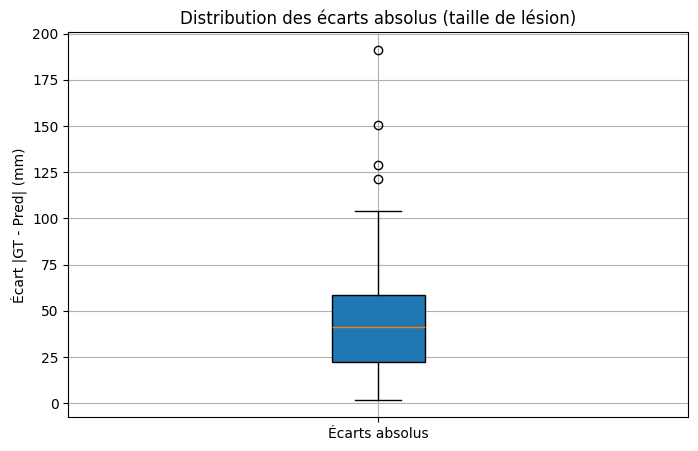

In [45]:
import numpy as np
import matplotlib.pyplot as plt

def eval_recist_all(base_path="./test/dcm/", seuil_mm=10.0):
    patients = sorted([p for p in os.listdir(base_path) if os.path.isdir(os.path.join(base_path, p))])
    
    abs_diffs = []
    raw_diffs = []
    n_correct_pred = 0
    n_valid = 0

    for patient_id in patients:
        patient_path = os.path.join(base_path, patient_id)
        try:
            gt_size, gt_status = recist_from_seg(patient_path, seuil_mm=seuil_mm)
        except Exception as e:
            print(f"[SKIP] Patient {patient_id} – erreur GT : {e}")
            continue

        try:
            pred_size, pred_status = recist_from_prediction_filtered(patient_id, seuil_mm=seuil_mm)
        except Exception as e:
            print(f"[SKIP] Patient {patient_id} – erreur prédiction : {e}")
            continue

        diff = pred_size - gt_size
        raw_diffs.append(diff)
        abs_diffs.append(abs(diff))
        n_valid += 1

        if gt_status == pred_status:
            n_correct_pred += 1

        print(f"- Patient {patient_id} → GT = {gt_size:.2f} mm | Pred = {pred_size:.2f} mm | Δ = {diff:.2f} mm | Corr = {gt_status == pred_status}")

    if n_valid == 0:
        print("Aucun patient valide pour l’évaluation.")
        return 0.0, 0.0

    # Statistiques
    abs_diffs = np.array(abs_diffs)
    raw_diffs = np.array(raw_diffs)

    mean_abs_diff = abs_diffs.mean()
    mean_diff = raw_diffs.mean()
    std_diff = raw_diffs.std()
    accuracy = n_correct_pred / n_valid * 100

    # Affichage final
    print("\n\n\n ================================= Résultats globaux ================================= \n")
    print(f"  ➤ Écart absolu moyen : {mean_abs_diff:.2f} mm")
    print(f"  ➤ Écart moyen : {mean_diff:.2f} mm")
    print(f"  ➤ Écart-type : {std_diff:.2f} mm")
    print(f"  ➤ Précision RECIST : {accuracy:.2f}% ({n_correct_pred}/{n_valid})")

    # Box plot
    plt.figure(figsize=(8, 5))
    plt.boxplot(abs_diffs, vert=True, patch_artist=True, labels=["Écarts absolus"])
    plt.ylabel("Écart |GT - Pred| (mm)")
    plt.title("Distribution des écarts absolus (taille de lésion)")
    plt.grid(True)
    plt.show()

    return mean_abs_diff, mean_diff, std_diff, accuracy

mean_abs, mean_signed, std, acc = eval_recist_all()



In [ ]:
base_path="./test/dcm/"
patients = sorted([p for p in os.listdir(base_path) if os.path.isdir(os.path.join(base_path, p))])

tot = 0
mesurable = 0

for patient_id in patients:
    _ , prediction = recist_from_seg(os.path.join(base_path, patient_id))
    tot += 1
    if prediction == "Mesurable" :.
        mesurable += 1
    
print(str(mesurable/tot * 100)+ " % de lésions mesurables")


100.0 % de lésions mesurables


<h2>Conclusion et limites de l’évaluation</h2>

<p>
Ce travail avait pour objectif d’évaluer la capacité du modèle <strong>BiomedParse</strong> à segmenter automatiquement les lésions pulmonaires visibles sur des images CT (format DICOM), et à en extraire des mesures cliniquement exploitables via le critère <strong>RECIST</strong>. Ce critère est couramment utilisé pour déterminer si une tumeur est <em>mesurable</em> ou non, ce qui conditionne souvent l’éligibilité d’un patient aux essais cliniques.
</p>

<p>
L’objectif principal est d’estimer automatiquement la taille maximale des lésions tumorales à partir des <strong>masques prédits</strong> par le modèle, afin de déterminer leur caractère <strong>mesurable</strong> selon les critères RECIST. Pour évaluer cette méthode, les résultats ont été comparés à ceux obtenus à partir des <strong>masques de vérité terrain</strong> (issus des fichiers DICOM-SEG). Bien que la <strong>précision binaire</strong> (mesurable / non mesurable) soit élevée (<strong>98.11%</strong> de concordance), les <strong>écarts sur la mesure des tailles</strong> entre prédictions et ground-truth restent particulièrement importants :
</p>


<ul>
  <li>Écart absolu moyen : <strong>46.65 mm</strong></li>
  <li>Écart moyen (signé) : <strong>+37.84 mm</strong></li>
  <li>Écart-type : <strong>46.47 mm</strong></li>
</ul>

<p>
Ces écarts traduisent une forte <strong>surestimation de la taille des lésions</strong> par le modèle. Autrement dit, le modèle détecte généralement bien qu’il y a une lésion, mais il tend à la surdimensionner fortement, ce qui limite la fiabilité des mesures.
</p>

<p>
Par ailleurs, le fait que <strong>100 % des patients de la base soient considérés “mesurables”</strong> (d’après les masques ground-truth) révèle une limite structurelle de la base elle-même. En pratique, les bases DICOM-SEG accessibles contiennent majoritairement des cas annotés précisément — donc typiquement des lésions bien visibles et mesurables. Il est donc difficile d’évaluer le modèle sur des cas limites ou non mesurables, faute de données appropriées.
</p>

<p>
En conclusion, si ce notebook constitue un bon point de départ pour une chaîne d’analyse RECIST automatisée, il met aussi en lumière plusieurs <strong>limitations majeures</strong> :
</p>

<ul>
  <li>La difficulté d’obtenir une estimation fiable de la taille réelle de la tumeur à partir des prédictions.</li>
  <li>Le besoin de bases de données plus diversifiées (incluant des lésions non mesurables).</li>
  <li>La nécessité d’un contrôle qualité plus fin des masques, ou d’une validation médicale en aval.</li>
</ul>


In [14]:
import shutil
import json
import os
import pydicom
import cv2
import numpy as np
from scipy.spatial.distance import pdist, squareform

def generate_non_measurable_cases(base_path="./test/dcm/", seuil_mm=10.0):
    existing_patients = sorted([int(p) for p in os.listdir(base_path) if p.isdigit()])
    next_id = max(existing_patients) + 1 if existing_patients else 1000

    for patient_id in existing_patients:
        patient_path = os.path.join(base_path, str(patient_id))
        images_dir = os.path.join(patient_path, "0")
        seg_path = os.path.join(patient_path, "1", "1-1.dcm")

        if not os.path.exists(images_dir) or not os.path.exists(seg_path):
            continue

        try:
            seg = pydicom.dcmread(seg_path)
            target_segment_number = get_target_segment_number(seg)
        except Exception as e:
            print(f"[SKIP] Patient {patient_id} : erreur SEG : {e}")
            continue

        # Masques utiles
        uids = []
        masks = []
        for i, f in enumerate(seg.PerFrameFunctionalGroupsSequence):
            if int(f.SegmentIdentificationSequence[0].ReferencedSegmentNumber) == target_segment_number:
                mask = seg.pixel_array[i]
                uid = f.DerivationImageSequence[0].SourceImageSequence[0].ReferencedSOPInstanceUID
                if mask.sum() > 0:
                    uids.append(uid)
                    masks.append(mask)
        uid_to_mask = dict(zip(uids, masks))

        dicom_files = sorted(
            [f for f in os.listdir(images_dir)],
            key=lambda x: pydicom.dcmread(os.path.join(images_dir, x), stop_before_pixels=True).InstanceNumber
        )

        non_measurable_paths = []

        for f in dicom_files:
            dcm_path = os.path.join(images_dir, f)
            dcm = pydicom.dcmread(dcm_path)
            uid = dcm.SOPInstanceUID

            if uid not in uid_to_mask:
                continue

            mask = uid_to_mask[uid]
            pixel_spacing = getattr(dcm, 'PixelSpacing', [1.0, 1.0])

            contours, _ = cv2.findContours(mask.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            for contour in contours:
                if len(contour) < 2:
                    continue
                points = contour[:, 0, :]
                i1, i2 = np.unravel_index(np.argmax(squareform(pdist(points))), (len(points), len(points)))
                p1, p2 = points[i1], points[i2]
                size_mm = measure_size_native(p1, p2, pixel_spacing)
                if size_mm < seuil_mm:
                    non_measurable_paths.append(dcm_path)
                    break  # une lésion non mesurable suffit pour garder la coupe

        # Ajout si ≥1 coupe détectée
        if non_measurable_paths:
            new_patient_id = str(next_id)
            new_path = os.path.join(base_path, new_patient_id)
            os.makedirs(os.path.join(new_path, "0"), exist_ok=True)
            os.makedirs(os.path.join(new_path, "1"), exist_ok=True)

            for dcm_path in non_measurable_paths:
                shutil.copy2(dcm_path, os.path.join(new_path, "0", os.path.basename(dcm_path)))

            shutil.copy2(seg_path, os.path.join(new_path, "1", "1-1.dcm"))
            print(f"[NEW] {len(non_measurable_paths)} coupes non mesurables → patient {new_patient_id}")
            next_id += 1

generate_non_measurable_cases()


[NEW] 1 coupes non mesurables → patient 57
[NEW] 1 coupes non mesurables → patient 58
[NEW] 1 coupes non mesurables → patient 59
[NEW] 2 coupes non mesurables → patient 60
[NEW] 1 coupes non mesurables → patient 61
[NEW] 1 coupes non mesurables → patient 62
[NEW] 1 coupes non mesurables → patient 63
[NEW] 1 coupes non mesurables → patient 64
[NEW] 1 coupes non mesurables → patient 65
[NEW] 1 coupes non mesurables → patient 66


In [16]:
base_path = "./test/dcm/"
patients = sorted([p for p in os.listdir(base_path) if os.path.isdir(os.path.join(base_path, p))])

tot = 0
mesurable = 0

for patient_id in patients:
    try:
        _, prediction = recist_from_seg(os.path.join(base_path, patient_id))
        tot += 1
        if prediction == "Mesurable":
            mesurable += 1
    except Exception as e:
        print(f"[SKIP] {patient_id}: {e}")

print(f"{mesurable/tot * 100:.2f}% de lésions mesurables")


87.30% de lésions mesurables


- Patient 0 → GT = 80.97 mm | Pred = 130.47 mm | Δ = 49.50 mm | Corr = True
- Patient 1 → GT = 102.73 mm | Pred = 171.89 mm | Δ = 69.15 mm | Corr = True
- Patient 10 → GT = 82.54 mm | Pred = 148.62 mm | Δ = 66.09 mm | Corr = True
- Patient 11 → GT = 93.92 mm | Pred = 86.77 mm | Δ = -7.15 mm | Corr = True
- Patient 14 → GT = 23.35 mm | Pred = 45.79 mm | Δ = 22.44 mm | Corr = True
- Patient 15 → GT = 63.50 mm | Pred = 213.89 mm | Δ = 150.39 mm | Corr = True
- Patient 16 → GT = 103.00 mm | Pred = 224.42 mm | Δ = 121.42 mm | Corr = True
- Patient 17 → GT = 72.94 mm | Pred = 138.35 mm | Δ = 65.41 mm | Corr = True
- Patient 18 → GT = 126.74 mm | Pred = 22.97 mm | Δ = -103.77 mm | Corr = True
- Patient 19 → GT = 72.83 mm | Pred = 85.31 mm | Δ = 12.48 mm | Corr = True
- Patient 2 → GT = 61.68 mm | Pred = 132.71 mm | Δ = 71.02 mm | Corr = True
- Patient 20 → GT = 23.64 mm | Pred = 45.91 mm | Δ = 22.27 mm | Corr = True
- Patient 21 → GT = 70.83 mm | Pred = 114.16 mm | Δ = 43.33 mm | Corr = True


/tmp/ipykernel_2793738/3002135663.py:61: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(abs_diffs, vert=True, patch_artist=True, labels=["Écarts absolus"])


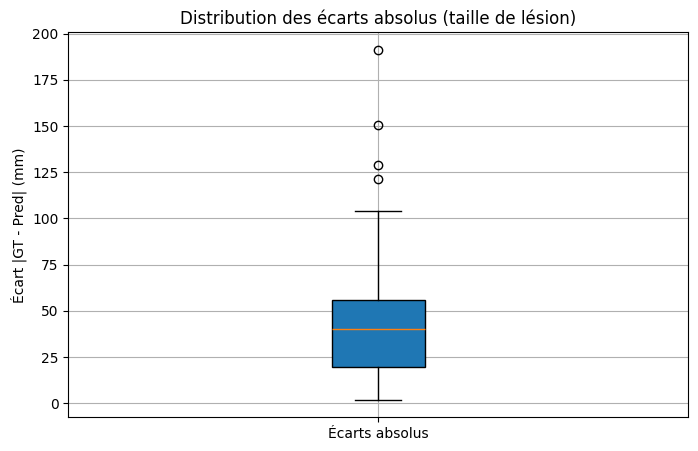

In [18]:
import numpy as np
import matplotlib.pyplot as plt

def eval_recist_all(base_path="./test/dcm/", seuil_mm=10.0):
    patients = sorted([p for p in os.listdir(base_path) if os.path.isdir(os.path.join(base_path, p))])
    
    abs_diffs = []
    raw_diffs = []
    n_correct_pred = 0
    n_valid = 0

    for patient_id in patients:
        patient_path = os.path.join(base_path, patient_id)
        try:
            gt_size, gt_status = recist_from_seg(patient_path, seuil_mm=seuil_mm)
        except Exception as e:
            print(f"[SKIP] Patient {patient_id} – erreur GT : {e}")
            continue
        
        if len(os.listdir(os.path.join(base_path, patient_id, "0"))) > 1 :
            try:
                pred_size, pred_status = recist_from_prediction_filtered(patient_id, seuil_mm=seuil_mm)
            except Exception as e:
                print(f"[SKIP] Patient {patient_id} – erreur prédiction : {e}")
                continue
        else :
            pred_size, pred_status = recist_from_prediction_strict(patient_id)

        diff = pred_size - gt_size
        raw_diffs.append(diff)
        abs_diffs.append(abs(diff))
        n_valid += 1

        if gt_status == pred_status:
            n_correct_pred += 1

        print(f"- Patient {patient_id} → GT = {gt_size:.2f} mm | Pred = {pred_size:.2f} mm | Δ = {diff:.2f} mm | Corr = {gt_status == pred_status}")

    if n_valid == 0:
        print("Aucun patient valide pour l’évaluation.")
        return 0.0, 0.0

    # Statistiques
    abs_diffs = np.array(abs_diffs)
    raw_diffs = np.array(raw_diffs)

    mean_abs_diff = abs_diffs.mean()
    mean_diff = raw_diffs.mean()
    std_diff = raw_diffs.std()
    accuracy = n_correct_pred / n_valid * 100

    # Affichage final
    print("\n\n\n ================================= Résultats globaux ================================= \n")
    print(f"  ➤ Écart absolu moyen : {mean_abs_diff:.2f} mm")
    print(f"  ➤ Écart moyen : {mean_diff:.2f} mm")
    print(f"  ➤ Écart-type : {std_diff:.2f} mm")
    print(f"  ➤ Précision RECIST : {accuracy:.2f}% ({n_correct_pred}/{n_valid})")

    # Box plot
    plt.figure(figsize=(8, 5))
    plt.boxplot(abs_diffs, vert=True, patch_artist=True, labels=["Écarts absolus"])
    plt.ylabel("Écart |GT - Pred| (mm)")
    plt.title("Distribution des écarts absolus (taille de lésion)")
    plt.grid(True)
    plt.show()

    return mean_abs_diff, mean_diff, std_diff, accuracy

mean_abs, mean_signed, std, acc = eval_recist_all()



<p>
    Avant l'ajout de cas non mesurables : <br>
    ➤ Écart absolu moyen : 46.65 mm <br>
    ➤ Écart moyen : 37.84 mm <br>
    ➤ Écart-type : 46.47 mm <br>
    ➤ Précision RECIST : 98.11% (52/53) <br>
</p>

<p>
    Avec cas non mesurables : <br>
    ➤ Écart absolu moyen : 43.86 mm <br>
    ➤ Écart moyen : 35.82 mm <br>
    ➤ Écart-type : 44.09 mm <br>
    ➤ Précision RECIST : 84.13% (53/63) <br>
</p>

<p>
    Les cas non-mesurables sont clairement mal traités.
</p>